In [1]:
import os
import requests
import pandas as pd
from bs4 import BeautifulSoup
import time
import io
from PIL import Image
import hashlib
import random
import re

In [ ]:
# Install required packages
!pip install selenium
!pip install webdriver-manager
!pip install beautifulsoup4
!pip install nltk
!pip install requests
!pip install pandas
!pip install matplotlib
!pip install seaborn
!pip install pillow
!pip install pydub
!pip install ffmpeg-python
!pip install papaparse

In [7]:
## API keys
PEXELS_API_KEY = "bFuUPaQfE4ZJpkPgBaV0cbuuIh0A5ie0o5jjXQf1NRoyAFcy4zduwUE9"
#UPSPLASH_API_KEY = ""

In [8]:
def download_images_pexels(query, folder_path, num_images=50):
    # Create folder if it doesn't exist
    os.makedirs(folder_path, exist_ok=True)
    
    # Metadata list
    metadata = []
    
    # API headers
    headers = {
        "Authorization": PEXELS_API_KEY
    }
    
    # Calculate number of pages to fetch (15 images per page max)
    num_pages = (num_images + 14) // 15
    count = 0
    
    try:
        for page in range(1, num_pages + 1):
            # API endpoint
            url = f"https://api.pexels.com/v1/search?query={query}&per_page=15&page={page}"
            
            # Make API request
            response = requests.get(url, headers=headers)
            
            if response.status_code == 200:
                data = response.json()
                
                # Process each photo
                for photo in data.get("photos", []):
                    if count >= num_images:
                        break
                    
                    # Get image URL and info
                    img_url = photo["src"]["original"]
                    img_width = photo["width"]
                    img_height = photo["height"]
                    photographer = photo["photographer"]
                    
                    try:
                        # Download image
                        img_response = requests.get(img_url)
                        
                        if img_response.status_code == 200:
                            # Generate filename
                            filename = hashlib.md5(img_url.encode()).hexdigest() + ".jpg"
                            file_path = os.path.join(folder_path, filename)
                            
                            # Save image
                            with open(file_path, "wb") as f:
                                f.write(img_response.content)
                            
                            # Add metadata
                            metadata.append({
                                "category": query,
                                "url": img_url,
                                "filename": filename,
                                "resolution": f"{img_width}x{img_height}",
                                "width": img_width,
                                "height": img_height,
                                "photographer": photographer,
                                "source": "Pexels API"
                            })
                            
                            count += 1
                            print(f"Downloaded {count}/{num_images} images for {query}")
                            
                            # Be gentle to the API
                            time.sleep(0.5)
                    
                    except Exception as e:
                        print(f"Error downloading image: {e}")
            
            else:
                print(f"API request failed with status code {response.status_code}: {response.text}")
                break
            
            # If we've reached the desired count or there are no more images, break
            if count >= num_images or "next_page" not in data or data["next_page"] is None:
                break
                
            # Be nice to the API
            time.sleep(1)
        
        print(f"Downloaded {count} images for category '{query}'")
        
    except Exception as e:
        print(f"Error processing category {query}: {e}")
    
    return metadata

In [ ]:
# List of 20 categories
categories = [
    "Indian Street Food", "Historic Monuments", "Traditional Dance", 
    "Modern Architecture", "Wildlife Conservation", "Rural Landscapes",
    "Urban Markets", "Festival Celebrations", "Classical Music Instruments",
    "Sustainable Farming", "Textile Patterns", "Ancient Artifacts",
    "Mountain Ranges", "Coastal Cities", "Religious Ceremonies",
    "Adventure Sports", "Handicrafts", "Spice Markets",
    "Temple Architecture", "River Ecosystems"
]

In [14]:
completed_categories = []

In [ ]:
base_folder = "CulturalVisualCorpus"
os.makedirs(base_folder, exist_ok=True)

all_metadata = []

for category in categories:
    if category in completed_categories:
        continue
    print(f"\nProcessing category: {category}")
    folder_path = os.path.join(base_folder, category.replace(" ", "_"))
    
    # Download images and get metadata
    category_metadata = download_images_pexels(category, folder_path)
    all_metadata.extend(category_metadata)
    
    # Save category-specific metadata
    category_df = pd.DataFrame(category_metadata)
    if not category_df.empty:
        category_df.to_csv(os.path.join(folder_path, f"{category.replace(' ', '_')}_metadata.csv"), index=False)

    completed_categories.append(category)

# Save all metadata to a CSV file
metadata_df = pd.DataFrame(all_metadata)
metadata_df.to_csv(os.path.join(base_folder, "complete_metadata.csv"), index=False)

print(f"Dataset collection complete. Total images: {len(all_metadata)}")


Processing category: Rural Landscapes
Downloaded 1/50 images for Rural Landscapes
Downloaded 2/50 images for Rural Landscapes
Downloaded 3/50 images for Rural Landscapes
Downloaded 4/50 images for Rural Landscapes
Downloaded 5/50 images for Rural Landscapes
Downloaded 6/50 images for Rural Landscapes
Downloaded 7/50 images for Rural Landscapes
Downloaded 8/50 images for Rural Landscapes
Downloaded 9/50 images for Rural Landscapes
Downloaded 10/50 images for Rural Landscapes
Downloaded 11/50 images for Rural Landscapes
Downloaded 12/50 images for Rural Landscapes
Downloaded 13/50 images for Rural Landscapes
Downloaded 14/50 images for Rural Landscapes
Downloaded 15/50 images for Rural Landscapes
Downloaded 16/50 images for Rural Landscapes
Downloaded 17/50 images for Rural Landscapes
Downloaded 18/50 images for Rural Landscapes
Downloaded 19/50 images for Rural Landscapes
Downloaded 20/50 images for Rural Landscapes
Downloaded 21/50 images for Rural Landscapes
Downloaded 22/50 images f

## Used technologies in the above extraction -
1. API of pexels website, to extract data from there.
2. 

## Use Case of this dataset
- This dataset could be used for developing an image recognition model that identifies various aspects of cultural heritage, tourism recommendation systems, or educational applications showcasing diverse cultural elements across the world.

=== Indian Cultural Visual Dataset Analysis ===

1. Analyzing dataset structure...
Dataset Structure Analysis:
Total categories: 20
Total images: 999

Images per category:
                       Category  Count
0              Adventure_Sports     50
1             Ancient_Artifacts     50
18                Urban_Markets     50
17            Traditional_Dance     50
16             Textile_Patterns     50
15          Temple_Architecture     50
14          Sustainable_Farming     50
13                Spice_Markets     50
12             Rural_Landscapes     50
11             River_Ecosystems     50
10         Religious_Ceremonies     50
9               Mountain_Ranges     50
8           Modern_Architecture     50
7            Indian_Street_Food     50
6            Historic_Monuments     50
5                   Handicrafts     50
3                Coastal_Cities     50
2   Classical_Music_Instruments     50
19        Wildlife_Conservation     50
4         Festival_Celebrations     49


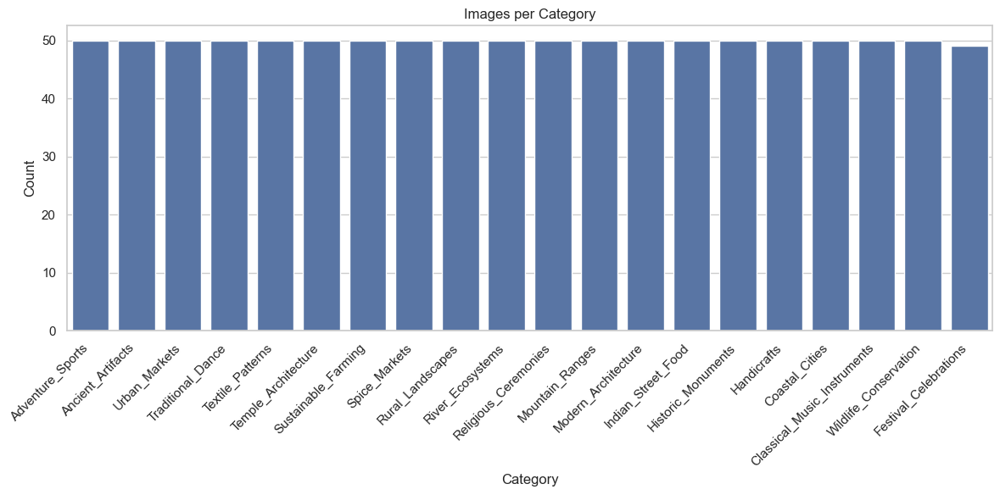


2. Analyzing image properties...

Image Properties Analysis:
Sampled images: 200

Image dimensions summary:
             width       height
count   200.000000   200.000000
mean   4445.830000  4552.575000
std    1458.000583  1349.309198
min    1728.000000  2136.000000
25%    3492.000000  3500.000000
50%    4095.000000  4160.000000
75%    5464.000000  5480.750000
max    8192.000000  8192.000000

Aspect ratio summary:
count    200.000000
mean       1.041977
std        0.402504
min        0.562500
25%        0.666667
50%        0.761845
75%        1.500000
max        1.779878
Name: aspect_ratio, dtype: float64

Color vs. Grayscale:
Color images: 200
Grayscale images: 0


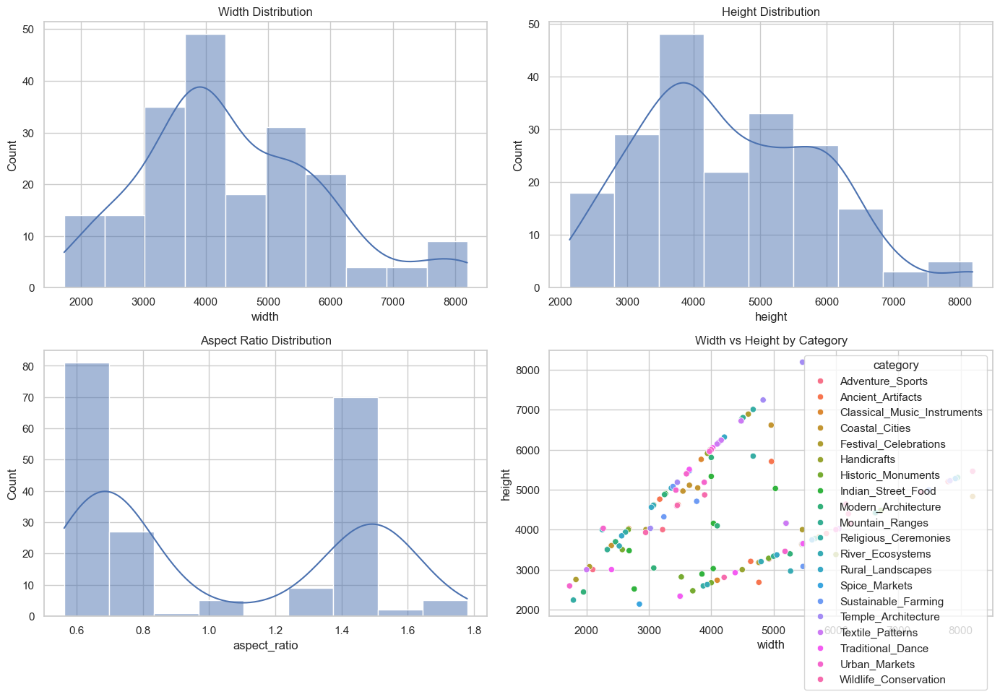


3. Extracting image features...
9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step

4. Visualizing feature space...
Applying t-SNE dimensionality reduction...


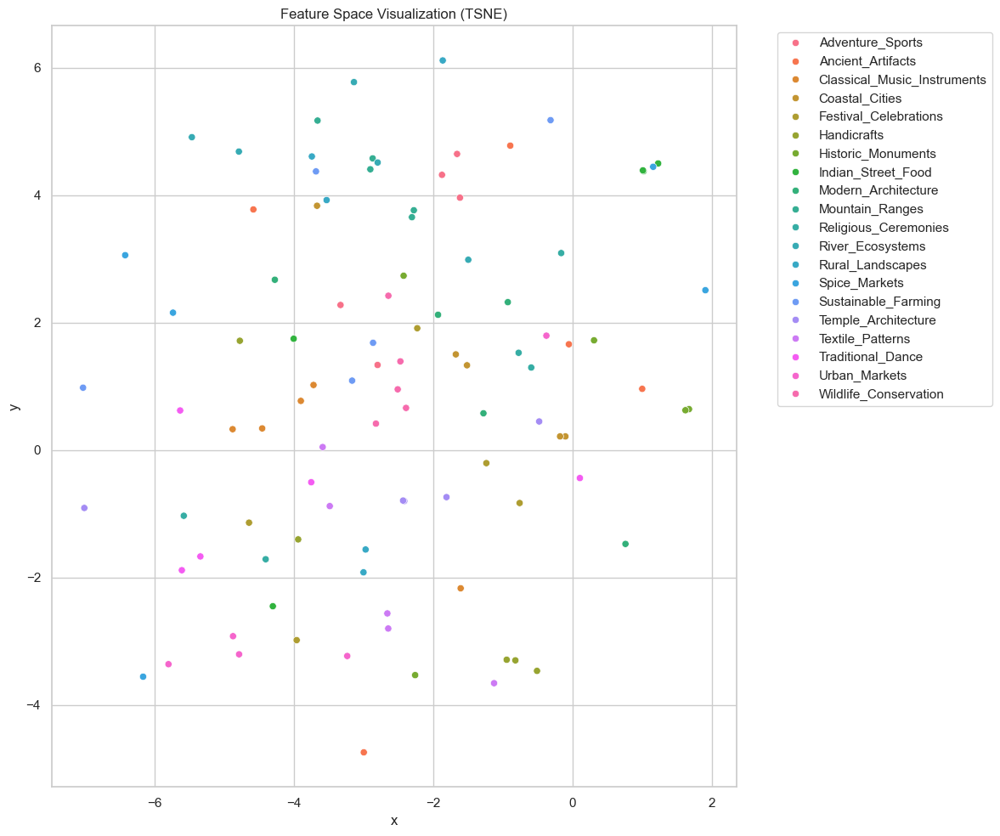


5. Finding similar images...
Query image: 776cf7ef6e6491865f6ca2a080086206.jpg (Category: Temple_Architecture)

Most similar images:
1. 28a938dabfe45034203e36fd5e33f50b.jpg (Category: Coastal_Cities, Distance: 25.4718)
2. 12e06a36809d2ded0ddf9def86409529.jpg (Category: Coastal_Cities, Distance: 25.5014)
3. 88cfad5dc2f508bc180983c82af17165.jpg (Category: Modern_Architecture, Distance: 25.6265)
4. ee6ab0700df22ae673bef7eb91572fd0.jpg (Category: Coastal_Cities, Distance: 25.7760)
5. a79cfaec656fce9881858e655a089559.jpg (Category: Mountain_Ranges, Distance: 26.3037)


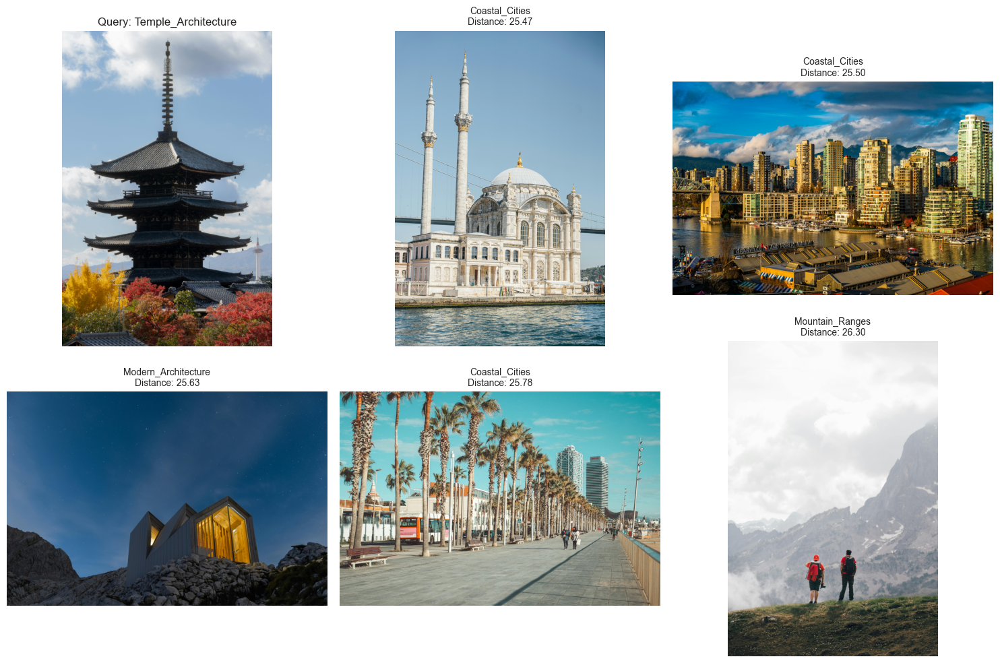


6. Analyzing category relationships...


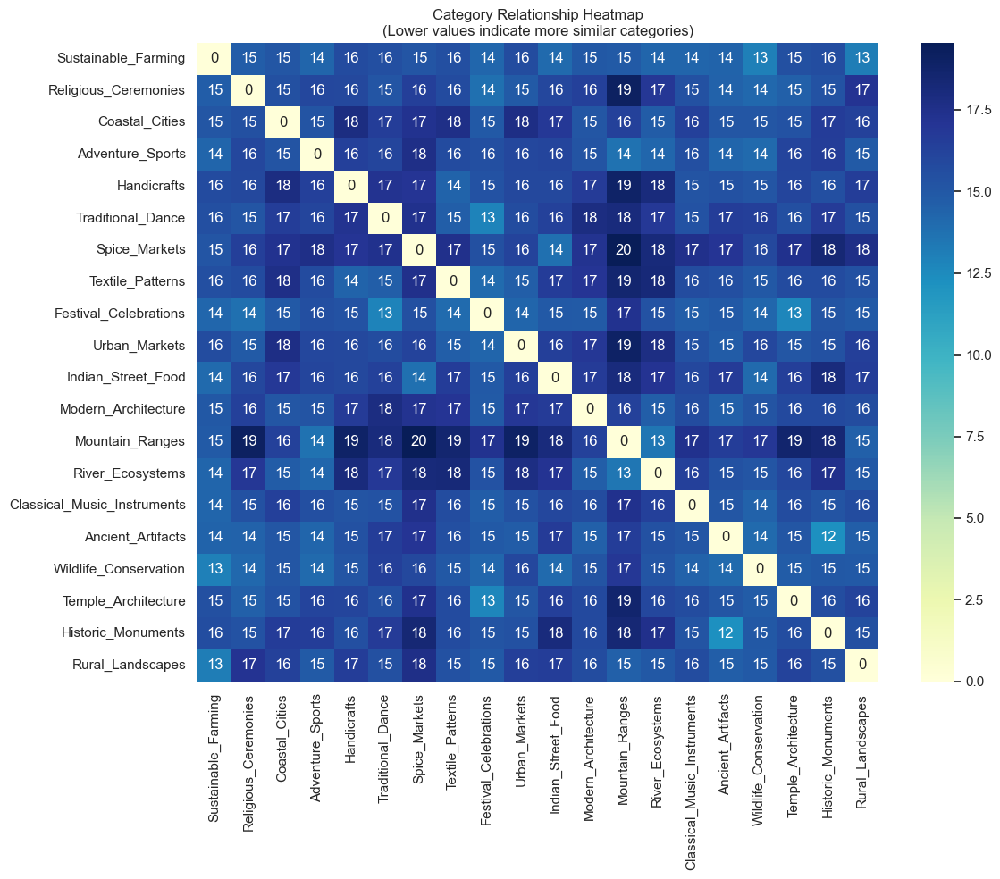

Most similar category pairs:
1. Ancient_Artifacts & Historic_Monuments (Distance: 12.2693)
2. Festival_Celebrations & Temple_Architecture (Distance: 12.6942)
3. Traditional_Dance & Festival_Celebrations (Distance: 12.8488)
4. Sustainable_Farming & Wildlife_Conservation (Distance: 12.9881)
5. Sustainable_Farming & Rural_Landscapes (Distance: 13.1396)

7. Tourism recommendations use case demo...

=== Tourism Recommendation Demo ===
Scenario: A user uploads three images from their past travels

Based on your Adventure Sports image, we recommend:
  1. Rishikesh - White water rafting in the Ganges
  2. Manali - Paragliding with Himalayan views
  3. Andaman Islands - Scuba diving in coral reefs

Based on your Ancient Artifacts image, we recommend:
  1. National Museum, Delhi - 5,000 years of Indian artifacts
  2. Salar Jung Museum, Hyderabad - One of India's largest collections
  3. Chhatrapati Shivaji Maharaj Vastu Sangrahalaya, Mumbai - Extensive collection

Based on your Mountain Ranges i

<Figure size 1200x800 with 0 Axes>

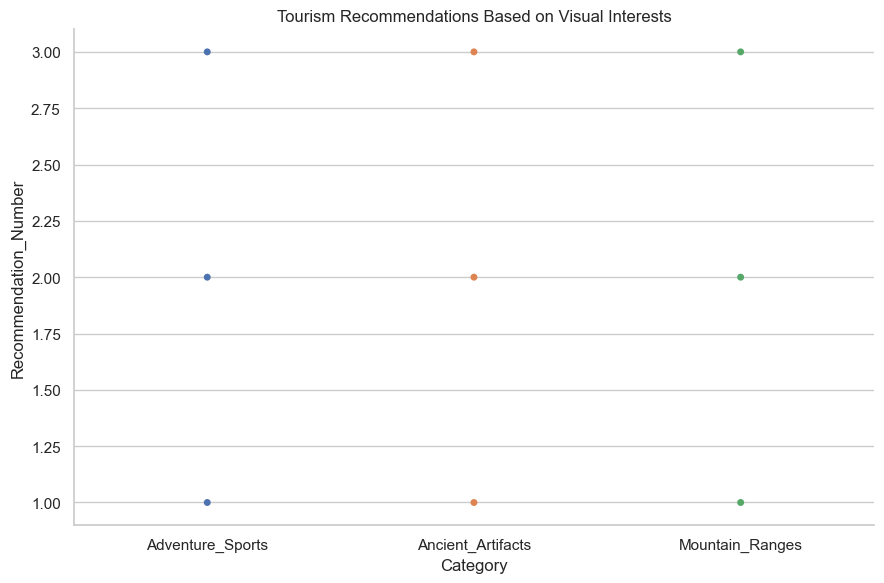

In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import random
from collections import Counter

# Set the path to your dataset
DATASET_PATH = r"C:\Users\Rishita\Desktop\MMDP-Assignment\Task1_a\CulturalVisualCorpus"  # Update this to your actual path

def analyze_dataset_structure():
    """Analyze and visualize the structure of the dataset"""
    # Get categories
    categories = [d for d in os.listdir(DATASET_PATH) 
                 if os.path.isdir(os.path.join(DATASET_PATH, d))]
    
    # Count images per category
    image_counts = {}
    for category in categories:
        category_path = os.path.join(DATASET_PATH, category)
        images = [f for f in os.listdir(category_path) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        image_counts[category] = len(images)
    
    # Convert to DataFrame for easier analysis
    df = pd.DataFrame(list(image_counts.items()), columns=['Category', 'Count'])
    df = df.sort_values('Count', ascending=False)
    
    # Display the counts
    print("Dataset Structure Analysis:")
    print(f"Total categories: {len(categories)}")
    print(f"Total images: {sum(image_counts.values())}")
    print("\nImages per category:")
    print(df)
    
    # Plot the distribution
    plt.figure(figsize=(12, 6))
    sns.barplot(x='Category', y='Count', data=df)
    plt.title('Images per Category')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('category_distribution.png')
    plt.show()
    
    return df

def analyze_image_properties():
    """Analyze image properties across the dataset"""
    # Get categories
    categories = [d for d in os.listdir(DATASET_PATH) 
                 if os.path.isdir(os.path.join(DATASET_PATH, d))]
    
    # Sample images from each category (to avoid processing all images)
    image_properties = []
    for category in categories:
        category_path = os.path.join(DATASET_PATH, category)
        images = [f for f in os.listdir(category_path) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        # Sample up to 10 images per category
        sampled_images = random.sample(images, min(10, len(images)))
        
        for img_file in sampled_images:
            img_path = os.path.join(category_path, img_file)
            try:
                with Image.open(img_path) as img:
                    width, height = img.size
                    aspect_ratio = width / height
                    is_color = img.mode == 'RGB'
                    
                    image_properties.append({
                        'category': category,
                        'filename': img_file,
                        'width': width,
                        'height': height,
                        'aspect_ratio': aspect_ratio,
                        'is_color': is_color
                    })
            except Exception as e:
                print(f"Error processing {img_path}: {e}")
    
    # Convert to DataFrame
    props_df = pd.DataFrame(image_properties)
    
    # Basic statistics
    print("\nImage Properties Analysis:")
    print(f"Sampled images: {len(props_df)}")
    print("\nImage dimensions summary:")
    print(props_df[['width', 'height']].describe())
    
    print("\nAspect ratio summary:")
    print(props_df['aspect_ratio'].describe())
    
    # Count color vs. grayscale
    color_counts = props_df['is_color'].value_counts()
    print("\nColor vs. Grayscale:")
    print(f"Color images: {color_counts.get(True, 0)}")
    print(f"Grayscale images: {color_counts.get(False, 0)}")
    
    # Visualize distributions
    fig, axes = plt.subplots(2, 2, figsize=(14, 10))
    
    # Width distribution
    sns.histplot(props_df['width'], kde=True, ax=axes[0, 0])
    axes[0, 0].set_title('Width Distribution')
    
    # Height distribution
    sns.histplot(props_df['height'], kde=True, ax=axes[0, 1])
    axes[0, 1].set_title('Height Distribution')
    
    # Aspect ratio distribution
    sns.histplot(props_df['aspect_ratio'], kde=True, ax=axes[1, 0])
    axes[1, 0].set_title('Aspect Ratio Distribution')
    
    # Width vs Height scatter
    sns.scatterplot(x='width', y='height', hue='category', data=props_df, ax=axes[1, 1])
    axes[1, 1].set_title('Width vs Height by Category')
    
    plt.tight_layout()
    plt.savefig('image_properties.png')
    plt.show()
    
    return props_df

def extract_features(model_name='mobilenetv2', sample_size=5):
    """Extract features from images using a pre-trained model"""
    # Get categories
    categories = [d for d in os.listdir(DATASET_PATH) 
                 if os.path.isdir(os.path.join(DATASET_PATH, d))]
    
    # Load pre-trained model
    if model_name.lower() == 'mobilenetv2':
        base_model = tf.keras.applications.MobileNetV2(
            weights='imagenet',
            include_top=False,
            pooling='avg'
        )
    elif model_name.lower() == 'resnet50':
        base_model = tf.keras.applications.ResNet50(
            weights='imagenet',
            include_top=False,
            pooling='avg'
        )
    else:
        raise ValueError("Unsupported model. Use 'mobilenetv2' or 'resnet50'")
    
    # Extract features
    features = []
    labels = []
    image_paths = []
    
    for category in categories:
        category_path = os.path.join(DATASET_PATH, category)
        images = [f for f in os.listdir(category_path) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        # Sample images from each category
        sampled_images = random.sample(images, min(sample_size, len(images)))
        
        for img_file in sampled_images:
            img_path = os.path.join(category_path, img_file)
            try:
                # Load and preprocess image
                img = load_img(img_path, target_size=(224, 224))
                img_array = img_to_array(img)
                img_array = np.expand_dims(img_array, axis=0)
                img_array = preprocess_input(img_array)
                
                # Extract features
                feature = base_model.predict(img_array, verbose=0)
                features.append(feature.flatten())
                labels.append(category)
                image_paths.append(img_path)
                
            except Exception as e:
                print(f"Error processing {img_path}: {e}")
    
    # Convert to numpy arrays
    features = np.array(features)
    
    return features, labels, image_paths

def visualize_feature_space(features, labels, technique='tsne'):
    """Visualize the feature space using dimensionality reduction"""
    # Reduce dimensions
    if technique.lower() == 'tsne':
        print("Applying t-SNE dimensionality reduction...")
        reducer = TSNE(n_components=2, random_state=42)
    elif technique.lower() == 'pca':
        print("Applying PCA dimensionality reduction...")
        reducer = PCA(n_components=2, random_state=42)
    else:
        raise ValueError("Unsupported technique. Use 'tsne' or 'pca'")
    
    reduced_features = reducer.fit_transform(features)
    
    # Create DataFrame for easier plotting
    df = pd.DataFrame({
        'x': reduced_features[:, 0],
        'y': reduced_features[:, 1],
        'category': labels
    })
    
    # Plot
    plt.figure(figsize=(12, 10))
    sns.scatterplot(x='x', y='y', hue='category', data=df)
    plt.title(f'Feature Space Visualization ({technique.upper()})')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.savefig(f'feature_space_{technique}.png')
    plt.show()
    
    return reduced_features, df

def find_similar_images(features, labels, image_paths, query_idx, n=5):
    """Find images similar to a query image using feature similarity"""
    # Extract query feature
    query_feature = features[query_idx]
    query_category = labels[query_idx]
    query_path = image_paths[query_idx]
    
    # Calculate distances to all other features
    distances = np.linalg.norm(features - query_feature, axis=1)
    
    # Get indices of most similar images (excluding the query image)
    similar_indices = np.argsort(distances)[1:n+1]
    
    # Get similar image info
    similar_images = [
        {
            'path': image_paths[i],
            'category': labels[i],
            'distance': distances[i]
        }
        for i in similar_indices
    ]
    
    # Display results
    print(f"Query image: {os.path.basename(query_path)} (Category: {query_category})")
    print("\nMost similar images:")
    
    plt.figure(figsize=(15, 10))
    
    # Display query image
    plt.subplot(2, 3, 1)
    query_img = plt.imread(query_path)
    plt.imshow(query_img)
    plt.title(f"Query: {query_category}", fontsize=12)
    plt.axis('off')
    
    # Display similar images
    for i, img_info in enumerate(similar_images):
        plt.subplot(2, 3, i+2)
        similar_img = plt.imread(img_info['path'])
        plt.imshow(similar_img)
        plt.title(f"{img_info['category']}\nDistance: {img_info['distance']:.2f}", fontsize=10)
        plt.axis('off')
        
        print(f"{i+1}. {os.path.basename(img_info['path'])} "
              f"(Category: {img_info['category']}, Distance: {img_info['distance']:.4f})")
    
    plt.tight_layout()
    plt.savefig('similar_images.png')
    plt.show()
    
    return similar_images

def analyze_category_relationships(features, labels):
    """Analyze relationships between categories based on feature similarity"""
    # Calculate average feature vector for each category
    categories = list(set(labels))
    category_features = {}
    
    for category in categories:
        category_indices = [i for i, label in enumerate(labels) if label == category]
        category_features[category] = np.mean(features[category_indices], axis=0)
    
    # Calculate pairwise distances between category centroids
    distances = np.zeros((len(categories), len(categories)))
    
    for i, cat1 in enumerate(categories):
        for j, cat2 in enumerate(categories):
            distances[i, j] = np.linalg.norm(
                category_features[cat1] - category_features[cat2]
            )
    
    # Create DataFrame for the distance matrix
    distance_df = pd.DataFrame(distances, index=categories, columns=categories)
    
    # Plot heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(distance_df, annot=True, cmap='YlGnBu')
    plt.title('Category Relationship Heatmap\n(Lower values indicate more similar categories)')
    plt.tight_layout()
    plt.savefig('category_relationships.png')
    plt.show()
    
    # Find most similar category pairs
    category_pairs = []
    for i, cat1 in enumerate(categories):
        for j, cat2 in enumerate(categories):
            if i < j:  # To avoid duplicates
                category_pairs.append({
                    'category1': cat1,
                    'category2': cat2,
                    'distance': distances[i, j]
                })
    
    # Sort by distance
    category_pairs.sort(key=lambda x: x['distance'])
    
    print("Most similar category pairs:")
    for i, pair in enumerate(category_pairs[:5]):
        print(f"{i+1}. {pair['category1']} & {pair['category2']} "
              f"(Distance: {pair['distance']:.4f})")
    
    return distance_df, category_pairs

def tourism_recommendations_demo():
    """Demonstrate how the image classification could be used for tourism recommendations"""
    # Define sample tourism recommendations for each category
    recommendations = {
        'Adventure_Sports': [
            "Rishikesh - White water rafting in the Ganges",
            "Manali - Paragliding with Himalayan views",
            "Andaman Islands - Scuba diving in coral reefs"
        ],
        'Ancient_Artifacts': [
            "National Museum, Delhi - 5,000 years of Indian artifacts",
            "Salar Jung Museum, Hyderabad - One of India's largest collections",
            "Chhatrapati Shivaji Maharaj Vastu Sangrahalaya, Mumbai - Extensive collection"
        ],
        'Mountain_Ranges': [
            "Himalayas - Experience the world's highest mountain range",
            "Western Ghats - UNESCO World Heritage site with rich biodiversity",
            "Aravalli Range - One of the oldest mountain ranges in the world"
        ]
    }
    
    # Simulate a user uploading images from different categories
    sample_categories = list(recommendations.keys())
    
    # Create a demo dataframe for visualization
    demo_data = []
    for category in sample_categories:
        for i, rec in enumerate(recommendations[category]):
            demo_data.append({
                'Category': category,
                'Recommendation': rec,
                'Recommendation_Number': i+1
            })
    
    demo_df = pd.DataFrame(demo_data)
    
    # Visualize the recommendations
    plt.figure(figsize=(12, 8))
    sns.catplot(
        x='Category', 
        y='Recommendation_Number', 
        hue='Category',
        data=demo_df, 
        kind='swarm',
        height=6,
        aspect=1.5
    )
    plt.title('Tourism Recommendations Based on Visual Interests')
    plt.tight_layout()
    plt.savefig('tourism_recommendations.png')
    
    # Print out the scenario
    print("\n=== Tourism Recommendation Demo ===")
    print("Scenario: A user uploads three images from their past travels")
    
    for category in sample_categories:
        print(f"\nBased on your {category.replace('_', ' ')} image, we recommend:")
        for i, rec in enumerate(recommendations[category]):
            print(f"  {i+1}. {rec}")

# Run the analysis (uncomment sections as needed)
if __name__ == "__main__":
    print("=== Indian Cultural Visual Dataset Analysis ===")
    
    # Analyze dataset structure
    print("\n1. Analyzing dataset structure...")
    structure_df = analyze_dataset_structure()
    
    # Analyze image properties
    print("\n2. Analyzing image properties...")
    props_df = analyze_image_properties()
    
    # Extract features and visualize feature space
    print("\n3. Extracting image features...")
    features, labels, image_paths = extract_features(sample_size=5)
    
    print("\n4. Visualizing feature space...")
    reduced_features, feature_df = visualize_feature_space(features, labels, technique='tsne')
    
    # Find similar images to a random query image
    print("\n5. Finding similar images...")
    query_idx = random.randint(0, len(features)-1)
    similar_images = find_similar_images(features, labels, image_paths, query_idx)
    
    # Analyze category relationships
    print("\n6. Analyzing category relationships...")
    distance_df, category_pairs = analyze_category_relationships(features, labels)
    
    # Demonstrate tourism recommendations use case
    print("\n7. Tourism recommendations use case demo...")
    tourism_recommendations_demo()
    
    print("\nAnalysis complete. Visualizations saved to disk.")

### Text Extraction

In [41]:
categories_websites = {
    "Global Politics": [
    "https://www.bbc.com/news/world",  # BBC World News
    "https://www.economist.com/world/",  # The Economist's global coverage
    "https://foreignpolicy.com/"  # Foreign Policy magazine
    ],
    "Technology Startups": [
        "https://techcrunch.com/",  # Global tech news
        "https://www.theverge.com/",  # Major tech publication
        "https://www.wired.com/"  # Leading tech magazine
    ],
    "Classical Dance": [
        "https://www.narthaki.com/",
        "https://www.dancemagazine.com/",  # Global dance publication
        "https://worlddancefestival.net/"  # International dance festival site
    ],
    "World Cuisine": [
        "https://www.seriouseats.com/",  # Comprehensive food site
        "https://www.eater.com/",  # Global food culture
        "https://www.bonappetit.com/"  # International recipes
    ],
    "Environmental Conservation": [
        "https://www.nationalgeographic.com/environment/",  # Global leader
        "https://www.worldwildlife.org/",  # Global conservation
        "https://www.iucn.org/"  # International Union for Conservation of Nature
    ],
    "Education Policy": [
        "https://www.unesco.org/en/education",  # Global education authority
        "https://www.oecd.org/education/",  # International education research
        "https://www.timeshighereducation.com/"  # Global higher education news
    ],
    "Space Research": [
        "https://www.nasa.gov/",  # NASA
        "https://www.esa.int/",  # European Space Agency
        "https://global.jaxa.jp/"  # Japan Aerospace Exploration Agency
    ],
    "Film Industry": [
        "https://variety.com/",  # Global entertainment news
        "https://www.hollywoodreporter.com/",  # Entertainment industry news
        "https://www.imdb.com/"  # International movie database
    ],
    "Healthcare Innovation": [
        "https://www.who.int/",  # World Health Organization
        "https://www.nature.com/subjects/health-care",  # Research publication
        "https://www.thelancet.com/"  # Premier medical journal
    ],
    "Artificial Intelligence": [
        "https://www.deeplearning.ai/",  # AI education
        "https://openai.com/blog/",  # Leading AI research organization
        "https://www.technologyreview.com/topic/artificial-intelligence/"  # MIT tech publication
    ],
    "Traditional Crafts": [
        "https://www.etsy.com/",  # Global marketplace for crafts
        "https://craftcouncil.org/",  # American Craft Council
        "https://www.craftscouncil.org.uk/"  # UK craft organization
    ],
    "Agricultural Practices": [
        "https://www.fao.org/",  # UN Food and Agriculture Organization
        "https://modernfarmer.com/",  # Modern global agriculture
        "https://www.agriculture.com/"  # International farming information
    ],
    "Tourism": [
        "https://www.lonelyplanet.com/",  # Global travel guide
        "https://www.nationalgeographic.com/travel/",  # National Geographic travel
        "https://www.tripadvisor.com/"  # Global travel reviews
    ],
    "Renewable Energy": [
        "https://www.irena.org/",  # International Renewable Energy Agency
        "https://www.iea.org/",  # International Energy Agency
        "https://www.renewableenergyworld.com/"  # Global renewable energy news
    ],
    "Literature": [
        "https://www.newyorker.com/books",  # Influential literary reviews
        "https://lithub.com/",  # Global literary hub
        "https://www.theparisreview.org/"  # Prestigious literary magazine
    ],
    "Women Empowerment": [
        "https://www.unwomen.org/",  # UN Women
        "https://www.globalfundforwomen.org/",  # Global Fund for Women
        "https://womendeliver.org/"  # Global advocacy organization
    ],
    "Sports": [
        "https://www.espn.com/",  # Global sports network
        "https://www.sportingnews.com/",  # International sports coverage
        "https://www.olympic.org/"  # International Olympic Committee
    ],
    "Economic Policy": [
        "https://www.economist.com/",  # Global economic perspective
        "https://www.worldbank.org/",  # World Bank
        "https://www.imf.org/"  # International Monetary Fund
    ],
    "Classical Music": [
        "https://www.gramophone.co.uk/",  # Classical music magazine
        "https://www.classicfm.com/",  # Global classical music broadcaster
        "https://www.deutschegrammophon.com/"  # Historic classical music label
    ],
    "Historical Research": [
        "https://www.historytoday.com/",  # International history magazine
        "https://www.smithsonianmag.com/history/",  # Smithsonian history content
        "https://www.bl.uk/"  # British Library
    ]
}

In [53]:
!pip install html2text justext

In [57]:
import os
import re
import random
import time
import requests
from bs4 import BeautifulSoup
import nltk
from nltk.tokenize import word_tokenize, sent_tokenize
from nltk.corpus import stopwords

# Download required NLTK resources if not already present
try:
    nltk.download('punkt', quiet=True)
    nltk.download('stopwords', quiet=True)
except:
    print("NLTK download failed, but continuing anyway")

def clean_text(text):
    """Clean and normalize text while maintaining readability."""
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    
    # Remove excessive whitespace while preserving paragraph breaks
    text = re.sub(r'\s+', ' ', text)
    text = re.sub(r'\n\s*\n', '\n\n', text)
    
    # Remove special characters but preserve sentence structure
    text = re.sub(r'[^\w\s.,!?;:\(\)\[\]\"\'-]', '', text)      
    # Trim leading/trailing whitespace
    text = text.strip()
    
    return text

def extract_useful_content(html_content):
    """Extract relevant content from HTML using BeautifulSoup."""
    soup = BeautifulSoup(html_content, 'html.parser')
    
    # Remove script, style, and navigation elements
    for element in soup(['script', 'style', 'nav', 'footer', 'header']):
        element.decompose()
    
    # Extract article titles with hierarchy
    titles = {
        'h1': [h.text.strip() for h in soup.find_all('h1') if h.text.strip()],
        'h2': [h.text.strip() for h in soup.find_all('h2') if h.text.strip()],
        'h3': [h.text.strip() for h in soup.find_all('h3') if h.text.strip()]
    }
    
    # Extract main content
    # Look for article or main content areas first
    content_areas = soup.select('article, .article, .content, .post, main, #main, #content, .entry')
    
    if content_areas:
        paragraphs = []
        for area in content_areas:
            paragraphs.extend([p.text.strip() for p in area.find_all('p') if p.text.strip()])
    else:
        # Fallback to all paragraphs
        paragraphs = [p.text.strip() for p in soup.find_all('p') if p.text.strip()]
    
    # Extract lists if available
    list_items = [li.text.strip() for li in soup.find_all('li') if li.text.strip()]
    
    # Combine all extracted content with proper formatting
    formatted_content = ""
    
    # Add title section with proper hierarchy
    if titles['h1']:
        formatted_content += "# " + "\n# ".join(titles['h1']) + "\n\n"
    if titles['h2']:
        formatted_content += "## " + "\n## ".join(titles['h2']) + "\n\n"
    if titles['h3']:
        formatted_content += "### " + "\n### ".join(titles['h3']) + "\n\n"
    
    # Add paragraph content with proper spacing
    if paragraphs:
        formatted_content += "\n\n".join(paragraphs) + "\n\n"
    
    # Add list items if available
    if list_items:
        formatted_content += "List items:\n" + "\n".join([f"• {item}" for item in list_items]) + "\n\n"
    
    return formatted_content

def crawl_website(url, headers, max_pages=3):
    """Crawl website with more in-depth content extraction."""
    print(f"  Crawling: {url}")
    all_text = []
    visited_urls = set()
    urls_to_visit = [url]
    
    try:
        for _ in range(max_pages):
            if not urls_to_visit:
                break
                
            current_url = urls_to_visit.pop(0)
            if current_url in visited_urls:
                continue
                
            visited_urls.add(current_url)
            print(f"    Visiting: {current_url}")
            
            try:
                response = requests.get(current_url, headers=headers, timeout=15)
                if response.status_code != 200:
                    print(f"    Failed: Status code {response.status_code}")
                    continue
                
                # Extract content
                content = extract_useful_content(response.text)
                cleaned_content = clean_text(content)
                if cleaned_content:
                    all_text.append(cleaned_content)
                
                # Find more links within the same domain
                if len(urls_to_visit) < max_pages:
                    soup = BeautifulSoup(response.text, 'html.parser')
                    try:
                        base_domain = re.search(r'https?://[^/]+', url).group(0)
                        
                        for link in soup.find_all('a', href=True):
                            href = link['href']
                            # Process relative URLs
                            if href.startswith('/'):
                                href = base_domain + href
                            # Only follow links from the same domain
                            if href.startswith(base_domain) and href not in visited_urls and href not in urls_to_visit:
                                urls_to_visit.append(href)
                    except:
                        print(f"    Error extracting links from {current_url}")
                
            except Exception as e:
                print(f"    Error processing {current_url}: {str(e)}")
            
            # Respect the website by waiting between requests
            time.sleep(random.uniform(3, 7))
    
    except Exception as e:
        print(f"  Error crawling {url}: {str(e)}")
    
    return "\n\n---\n\n".join(all_text)

def save_formatted_text(text, file_path):
    """Save text with proper formatting for readability."""
    try:
        # Split text into sentences
        sentences = sent_tokenize(text)
        
        # Organize into paragraphs (roughly 5-7 sentences per paragraph)
        paragraphs = []
        current_paragraph = []
        
        for sentence in sentences:
            current_paragraph.append(sentence)
            if len(current_paragraph) >= random.randint(3, 5):
                paragraphs.append(" ".join(current_paragraph))
                current_paragraph = []
        
        # Add any remaining sentences
        if current_paragraph:
            paragraphs.append(" ".join(current_paragraph))
        
        # Format with proper paragraph spacing
        formatted_text = "\n\n".join(paragraphs)
        
        # Save to file
        with open(file_path, 'w', encoding='utf-8') as f:
            f.write(formatted_text)
        
        return len(formatted_text)
    except Exception as e:
        print(f"  Error saving to {file_path}: {str(e)}")
        return 0

def create_category_summary(category_text, num_words=100):
    """Create a summary of the category content."""
    try:
        # Remove stopwords for term frequency analysis
        stop_words = set(stopwords.words('english'))
        words = []
        for text in category_text:
            try:
                words.extend([word.lower() for word in word_tokenize(text) 
                             if word.isalpha() and word.lower() not in stop_words])
            except:
                pass
        
        # Get word frequency
        from collections import Counter
        word_freq = Counter(words)
        
        # Get most common words
        most_common = word_freq.most_common(20)
        
        summary = f"Top terms: {', '.join([word for word, count in most_common])}\n\n"
        summary += f"Total content: {sum(len(text) for text in category_text)} characters\n"
        summary += f"Approximate word count: {sum(len(text.split()) for text in category_text)} words\n"
        
        return summary
    except Exception as e:
        print(f"  Error creating summary: {str(e)}")
        return "Error creating summary"

# Main execution
base_folder = "GlobalContextualTextCorpus"
os.makedirs(base_folder, exist_ok=True)

# User agents list for rotation
user_agents = [
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/91.0.4472.124 Safari/537.36',
    'Mozilla/5.0 (X11; Linux x86_64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.107 Safari/537.36',
    'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:90.0) Gecko/20100101 Firefox/90.0',
    'Mozilla/5.0 (Macintosh; Intel Mac OS X 10_15_7) AppleWebKit/605.1.15 (KHTML, like Gecko) Version/14.1.2 Safari/605.1.15'
]

for category, websites in categories_websites.items():
    print(f"Processing category: {category}")
    category_folder = os.path.join(base_folder, category.replace(' ', '_'))
    os.makedirs(category_folder, exist_ok=True)
    
    category_text = []
    
    for i, website in enumerate(websites):
        # Rotate user agents
        headers = {
            'User-Agent': random.choice(user_agents),
            'Accept': 'text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8',
            'Accept-Language': 'en-US,en;q=0.5',
            'Referer': 'https://www.google.com/'
        }
        
        # Crawl website (with deeper crawling - visit up to 3 pages per website)
        text = crawl_website(website, headers, max_pages=3)
        
        if text:
            # Save individual website content
            site_name = re.sub(r'https?://(www\.)?([^/]+).*', r'\2', website)
            file_path = os.path.join(category_folder, f"{site_name}.txt")
            char_count = save_formatted_text(text, file_path)
            print(f"    Saved {char_count} characters from {site_name}")
            
            category_text.append(text)
    
    # Create category summary
    if category_text:
        # Combine all text from websites in this category for master file
        combined_text = "\n\n====================\n\n".join(category_text)
        
        # Create and save summary
        summary = create_category_summary(category_text)
        summary_path = os.path.join(category_folder, "_summary.txt")
        with open(summary_path, 'w', encoding='utf-8') as f:
            f.write(summary)
        
        # Save combined category file
        master_path = os.path.join(category_folder, "_all_content.txt")
        char_count = save_formatted_text(combined_text, master_path)
        print(f"  Saved {char_count} characters combined for {category}")
    else:
        print(f"  No content gathered for {category}")

print("Text dataset collection complete.")

Processing category: Global Politics
  Crawling: https://www.bbc.com/news/world
    Visiting: https://www.bbc.com/news/world
    Visiting: https://www.bbc.com/
    Visiting: https://www.bbc.com/news
    Saved 37665 characters from bbc.com
  Crawling: https://www.economist.com/world/
    Visiting: https://www.economist.com/world/
    Failed: Status code 404
  Crawling: https://foreignpolicy.com/
    Visiting: https://foreignpolicy.com/
    Visiting: https://foreignpolicy.com/cdn-cgi/l/email-protection#5d2e282d2d322f291d3b322f38343a332d3231343e24733e3230
    Visiting: https://foreignpolicy.com/category/latest
    Saved 18301 characters from foreignpolicy.com
  Saved 55993 characters combined for Global Politics
Processing category: Technology Startups
  Crawling: https://techcrunch.com/
    Visiting: https://techcrunch.com/
    Visiting: https://techcrunch.com
    Visiting: https://techcrunch.com/latest/
    Saved 31509 characters from techcrunch.com
  Crawling: https://www.theverge.com/

## Use case

In [1]:
import os
import pandas as pd
import numpy as np
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.metrics import classification_report
from sklearn.pipeline import Pipeline
import joblib
import matplotlib.pyplot as plt
import seaborn as sns
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
import re
import nltk

In [2]:

def load_dataset(base_folder):
    """
    Load text data from the folder structure created by the web crawler script.
    
    Args:
        base_folder: Path to the GlobalContextualTextCorpus folder
        
    Returns:
        A DataFrame with 'text' and 'category' columns
    """
    data = {'text': [], 'category': []}
    
    # Walk through folder structure
    for category_folder in os.listdir(base_folder):
        category_path = os.path.join(base_folder, category_folder)
        
        # Skip if not a directory
        if not os.path.isdir(category_path):
            continue
            
        # Convert folder name back to category name
        category = category_folder.replace('_', ' ')
        
        # Process each file in the category folder
        for file_name in os.listdir(category_path):
            # Skip summary and combined files
            if file_name.startswith('_'):
                continue
                
            file_path = os.path.join(category_path, file_name)
            
            # Read the file content
            try:
                with open(file_path, 'r', encoding='utf-8') as f:
                    text = f.read()
                    
                # Add to dataset
                data['text'].append(text)
                data['category'].append(category)
            except Exception as e:
                print(f"Error reading {file_path}: {str(e)}")
    
    return pd.DataFrame(data)

def preprocess_text(text):
    """Clean and preprocess text for classification."""
    # Convert to lowercase
    text = text.lower()
    
    # Remove URLs
    text = re.sub(r'http\S+', '', text)
    
    # Remove special characters and digits
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(r'\d+', '', text)
    
    # Tokenize
    tokens = word_tokenize(text)
    
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    tokens = [word for word in tokens if word not in stop_words]
    
    return ' '.join(tokens)

def visualize_results(y_test, y_pred, categories):
    """Create visualizations for model performance."""
    # Create confusion matrix
    cm = pd.crosstab(y_test, y_pred, rownames=['Actual'], colnames=['Predicted'])
    
    plt.figure(figsize=(10, 8))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=categories, yticklabels=categories)
    plt.title('Confusion Matrix')
    plt.tight_layout()
    plt.savefig('confusion_matrix.png')
    
    # Plot category distribution
    plt.figure(figsize=(12, 6))
    category_counts = pd.Series(y_test).value_counts()
    sns.barplot(x=category_counts.index, y=category_counts.values)
    plt.title('Category Distribution in Test Set')
    plt.xticks(rotation=45, ha='right')
    plt.tight_layout()
    plt.savefig('category_distribution.png')

def train_classifier(base_folder):
    """Train a text classifier on the crawled dataset."""
    print("Loading dataset...")
    df = load_dataset(base_folder)
    
    if df.empty or len(df) < 10:
        print("Not enough data to train a model. Make sure the crawler has run successfully.")
        return
    
    print(f"Dataset loaded: {len(df)} documents across {df['category'].nunique()} categories")
    
    # Preview dataset
    print("\nCategory distribution:")
    print(df['category'].value_counts())
    
    # Preprocess text
    print("\nPreprocessing text...")
    df['processed_text'] = df['text'].apply(preprocess_text)
    
    # Split into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(
        df['processed_text'], df['category'], test_size=0.3, random_state=42, stratify=df['category'] if len(df) > 10 else None
    )
    
    print(f"Training set: {len(X_train)} samples")
    print(f"Testing set: {len(X_test)} samples")
    
    # Create and train classification pipeline
    print("\nTraining classifier...")
    classifier = Pipeline([
        ('tfidf', TfidfVectorizer(max_features=5000)),
        ('clf', LinearSVC(C=1.0))
    ])
    
    classifier.fit(X_train, y_train)
    
    # Evaluate the classifier
    print("\nEvaluating classifier...")
    y_pred = classifier.predict(X_test)
    
    print("\nClassification Report:")
    print(classification_report(y_test, y_pred))
    
    # Save the model
    joblib.dump(classifier, 'topic_classifier.pkl')
    print("\nModel saved as 'topic_classifier.pkl'")
    
    # Visualize results
    print("\nGenerating visualizations...")
    categories = sorted(df['category'].unique())
    visualize_results(y_test, y_pred, categories)
    
    return classifier

def classify_new_text(classifier, text):
    """Use the trained model to classify new text."""
    processed_text = preprocess_text(text)
    
    if not processed_text:
        return "Empty text cannot be classified"
    
    prediction = classifier.predict([processed_text])[0]
    return prediction


In [3]:
try:
    import sklearn
    print(f"scikit-learn is installed.")
    print(f"Version: {sklearn.__version__}")
    
    # Get more detailed information about the installation
    import sys
    print(f"\nPython version: {sys.version}")
    
    # Check key scikit-learn dependencies
    import numpy
    import scipy
    import joblib
    
    print(f"\nKey dependencies:")
    print(f"NumPy version: {numpy.__version__}")
    print(f"SciPy version: {scipy.__version__}")
    print(f"joblib version: {joblib.__version__}")
    
    # Verify that the core functionality works
    from sklearn import datasets
    from sklearn.ensemble import RandomForestClassifier
    
    # Load a sample dataset
    iris = datasets.load_iris()
    X, y = iris.data, iris.target
    
    # Try to instantiate a model
    model = RandomForestClassifier()
    print("\nSuccessfully created a RandomForestClassifier instance.")
    print("scikit-learn appears to be working correctly.")
    
except ImportError:
    print("scikit-learn is not installed.")
    print("You can install it using: pip install scikit-learn")
    
except Exception as e:
    print(f"An error occurred while checking scikit-learn: {e}")

scikit-learn is installed.
Version: 1.5.2

Python version: 3.11.9 (tags/v3.11.9:de54cf5, Apr  2 2024, 10:12:12) [MSC v.1938 64 bit (AMD64)]

Key dependencies:
NumPy version: 1.26.4
SciPy version: 1.14.1
joblib version: 1.4.2

Successfully created a RandomForestClassifier instance.
scikit-learn appears to be working correctly.


In [4]:
# Example usage
if __name__ == "__main__":
    # Train the classifier
    base_folder = "GlobalContextualTextCorpus"
    classifier = train_classifier(base_folder)
    
    if classifier:
        # Example new text to classify
        test_texts = [
            "Global temperatures continue to rise as climate scientists warn of severe impacts. New data suggests that the Arctic ice cap has shrunk by an additional 3% this year.",
            "The latest smartphone from Apple features an improved camera system and longer battery life. Tech reviewers are praising its new AI capabilities.",
            "Researchers have discovered a potential new treatment for diabetes that could eliminate the need for daily insulin injections. Clinical trials show promising results."
        ]
        
        print("\n--- Example Classifications ---")
        for text in test_texts:
            print(f"\nText: {text[:100]}...")
            print(f"Predicted category: {classify_new_text(classifier, text)}")
        
        # Interactive mode
        print("\n--- Interactive Classification ---")
        print("Enter text to classify (type 'exit' to quit):")
        
        while True:
            user_input = input("> ")
            if user_input.lower() == 'exit':
                break
            
            if user_input:
                category = classify_new_text(classifier, user_input)
                print(f"Predicted category: {category}")
            else:
                print("Please enter some text to classify.")

Loading dataset...
Dataset loaded: 51 documents across 20 categories

Category distribution:
category
Agricultural Practices        3
Renewable Energy              3
Women Empowerment             3
Traditional Crafts            3
Tourism                       3
Technology Startups           3
Sports                        3
Space Research                3
World Cuisine                 3
Film Industry                 3
Economic Policy               3
Classical Music               3
Healthcare Innovation         2
Artificial Intelligence       2
Literature                    2
Global Politics               2
Environmental Conservation    2
Education Policy              2
Historical Research           2
Classical Dance               1
Name: count, dtype: int64

Preprocessing text...


ValueError: The least populated class in y has only 1 member, which is too few. The minimum number of groups for any class cannot be less than 2.

In [12]:
import os
import re
import numpy as np
import pandas as pd
import networkx as nx
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.decomposition import TruncatedSVD
import nltk
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
import spacy
import gensim
from gensim.models import Word2Vec
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
from wordcloud import WordCloud
import matplotlib.cm as cm
import warnings
import json
from collections import Counter
from tqdm import tqdm

# Suppress warnings for cleaner output
warnings.filterwarnings("ignore")

# Download NLTK resources if not already present
try:
    nltk.download('punkt', quiet=True)
    nltk.download('stopwords', quiet=True)
    nltk.download('wordnet', quiet=True)
except:
    print("NLTK download failed, but continuing anyway")
    
# Load spaCy model if available
try:
    nlp = spacy.load("en_core_web_sm")
except:
    print("spaCy model not available. Install with 'python -m spacy download en_core_web_sm'")
    nlp = None

class CrossDomainKnowledgeGraph:
    """
    A system for creating and analyzing cross-domain knowledge graphs
    from text corpora across different subject areas.
    """
    
    def __init__(self, base_folder="GlobalContextualTextCorpus"):
        """Initialize the knowledge graph generator."""
        self.base_folder = base_folder
        self.categories = []
        self.texts = {}
        self.category_keywords = {}
        self.key_concepts = {}
        self.cross_references = {}
        self.vectorizer = None
        self.lemmatizer = WordNetLemmatizer()
        self.stop_words = set(stopwords.words('english'))
        self.category_embeddings = {}
        self.entity_categories = {}
        self.graph = nx.Graph()
        self.doc2vec_model = None
        self.output_folder = "CrossDomainAnalysis"
        
        # Custom subject-specific stopwords
        self.custom_stopwords = {
            "general": ["also", "one", "two", "three", "may", "many", "using", "can", "use", 
                       "used", "like", "even", "well", "first", "often", "however", "though",
                       "without", "within", "although", "among", "around", "because", "become",
                       "comes", "either", "else", "etc", "ever", "every", "example"],
            "article_words": ["article", "author", "published", "journal", "research", "study", 
                             "paper", "chapter", "section", "page", "figure", "table", "et", "al"]
        }
        
        # Ensure output folder exists
        os.makedirs(self.output_folder, exist_ok=True)
        
    def load_corpus(self, file_pattern="_all_content.txt"):
        """
        Load text data from category folders, looking for the specified file pattern.
        
        Args:
            file_pattern: Pattern to match content files (default: "_all_content.txt")
            
        Returns:
            Number of categories loaded
        """
        try:
            print(f"Loading corpus from {self.base_folder}...")
            
            # Check if base folder exists
            if not os.path.isdir(self.base_folder):
                print(f"Error: Base folder '{self.base_folder}' not found.")
                return 0
                
            # Scan for category folders
            category_dirs = []
            for item in os.listdir(self.base_folder):
                full_path = os.path.join(self.base_folder, item)
                if os.path.isdir(full_path):
                    category_dirs.append(item)
            
            if not category_dirs:
                print(f"No category folders found in {self.base_folder}")
                return 0
                
            print(f"Found {len(category_dirs)} potential category folders")
            
            # Process each category
            for category_dir in category_dirs:
                category_path = os.path.join(self.base_folder, category_dir)
                content_file = os.path.join(category_path, file_pattern)
                
                # Check if the content file exists
                if os.path.isfile(content_file):
                    # Read content file
                    try:
                        with open(content_file, 'r', encoding='utf-8') as f:
                            content = f.read()
                            
                        # Clean category name
                        category_name = category_dir.replace('_', ' ')
                        
                        # Store category and content
                        self.categories.append(category_name)
                        self.texts[category_name] = content
                        
                        print(f"  ✓ Loaded '{category_name}' ({len(content)} characters)")
                    except Exception as e:
                        print(f"  ✗ Error reading {content_file}: {str(e)}")
                else:
                    print(f"  ✗ No {file_pattern} found in {category_path}")
            
            print(f"Successfully loaded {len(self.categories)} categories")
            return len(self.categories)
            
        except Exception as e:
            print(f"Error loading corpus: {str(e)}")
            return 0
    
    def preprocess_text(self, text, remove_custom_stopwords=True):
        """Preprocess text for analysis."""
        if not text:
            return ""
        
        # Convert to lowercase
        text = text.lower()
        
        # Remove URLs
        text = re.sub(r'http\S+', '', text)
        
        # Remove special characters but keep sentence structure
        text = re.sub(r'[^\w\s.,!?;:\-]', ' ', text)
        
        # Replace numbers with space
        text = re.sub(r'\d+', ' ', text)
        
        # Tokenize
        words = word_tokenize(text)
        
        # Remove stopwords and lemmatize
        filtered_words = []
        for word in words:
            # Skip short words and stopwords
            if len(word) <= 2 or word in self.stop_words:
                continue
                
            # Skip custom stopwords if enabled
            if remove_custom_stopwords:
                if word in self.custom_stopwords["general"] or word in self.custom_stopwords["article_words"]:
                    continue
            
            # Lemmatize and add to filtered words
            filtered_words.append(self.lemmatizer.lemmatize(word))
        
        return ' '.join(filtered_words)
    
    def extract_key_concepts(self, top_n=25, min_df=2):
        """
        Extract key concepts from each category using TF-IDF.
        
        Args:
            top_n: Number of top concepts to extract per category
            min_df: Minimum document frequency for TF-IDF
        """
        if not self.categories:
            print("No categories loaded. Please load corpus first.")
            return
        
        print(f"Extracting key concepts from {len(self.categories)} categories...")
        
        # Preprocess texts
        preprocessed_texts = {category: self.preprocess_text(text) 
                             for category, text in self.texts.items()}
        
        # Create corpus and category list for vectorization
        corpus = []
        corpus_categories = []
        for category, text in preprocessed_texts.items():
            corpus.append(text)
            corpus_categories.append(category)
        
        # Vectorize the corpus
        self.vectorizer = TfidfVectorizer(max_features=10000, min_df=min_df, max_df=0.8)
        tfidf_matrix = self.vectorizer.fit_transform(corpus)
        
        # Get feature names
        feature_names = self.vectorizer.get_feature_names_out()
        
        # Extract top concepts for each category
        for i, category in enumerate(corpus_categories):
            # Get feature indices sorted by importance
            feature_indices = tfidf_matrix[i].nonzero()[1]
            tfidf_scores = [(feature_names[index], tfidf_matrix[i, index]) 
                           for index in feature_indices]
            
            # Sort by score
            tfidf_scores = sorted(tfidf_scores, key=lambda x: x[1], reverse=True)
            
            # Store top concepts
            self.category_keywords[category] = tfidf_scores[:top_n]
            
            # Print sample of top concepts
            concept_sample = ', '.join([concept for concept, _ in tfidf_scores[:5]])
            print(f"  ✓ {category}: {concept_sample}...")
        
        return self.category_keywords
    
    def find_cross_domain_connections(self, threshold=0.2):
        """
        Find connections between concepts across different domains.
        
        Args:
            threshold: Similarity threshold for considering concepts related
        """
        if not self.category_keywords:
            print("No key concepts extracted. Please run extract_key_concepts first.")
            return
        
        print("Analyzing cross-domain connections...")
        
        # Prepare list of all key concepts
        all_concepts = {}
        for category, concepts in self.category_keywords.items():
            for concept, score in concepts:
                if concept not in all_concepts:
                    all_concepts[concept] = {'score': score, 'categories': [category]}
                else:
                    all_concepts[concept]['categories'].append(category)
                    all_concepts[concept]['score'] = max(all_concepts[concept]['score'], score)
        
        # Find connections between concepts from different domains
        self.cross_references = {}
        
        # Process each category
        for category in self.categories:
            # Extract concepts for this category
            category_concepts = [concept for concept, _ in self.category_keywords[category]]
            
            # Find related concepts from other categories
            related_concepts = {}
            
            for concept in category_concepts:
                # Skip concepts with underscores or less than 3 chars
                if '_' in concept or len(concept) < 3:
                    continue
                    
                # Search for this concept in other categories' texts
                for other_category in self.categories:
                    if other_category == category:
                        continue
                        
                    # Check for direct matches or similar terms
                    other_text = self.texts[other_category].lower()
                    
                    # Direct match (frequency of concept in other category)
                    match_pattern = r'\b' + re.escape(concept) + r'\b'
                    matches = re.findall(match_pattern, other_text)
                    match_count = len(matches)
                    
                    if match_count >= 3:  # At least 3 occurrences
                        if concept not in related_concepts:
                            related_concepts[concept] = []
                        
                        related_concepts[concept].append({
                            'category': other_category,
                            'frequency': match_count,
                            'score': match_count / len(other_text.split()) * 1000  # Normalized score
                        })
            
            # Store related concepts for this category
            self.cross_references[category] = related_concepts
            
            # Show sample of cross-references
            concept_count = sum(len(refs) for refs in related_concepts.values())
            print(f"  ✓ {category}: Found {concept_count} cross-domain references")
        
        return self.cross_references
    
    def build_knowledge_graph(self, max_nodes=200, min_edge_weight=3):
        """
        Build a knowledge graph connecting concepts across domains.
        
        Args:
            max_nodes: Maximum number of nodes to include
            min_edge_weight: Minimum edge weight to include
        """
        if not self.cross_references:
            print("No cross-references found. Please run find_cross_domain_connections first.")
            return
        
        print("Building knowledge graph...")
        
        # Create a new graph
        self.graph = nx.Graph()
        
        # Add category nodes
        for category in self.categories:
            self.graph.add_node(category, type='category', size=30)
        
        # Track all concept nodes and their connections
        concept_connections = {}
        
        # Process cross-references to build edges
        for category, concepts in self.cross_references.items():
            for concept, references in concepts.items():
                # Add concept node if it appears in multiple categories
                if len(references) > 0:
                    if concept not in concept_connections:
                        concept_connections[concept] = {
                            'categories': [category],
                            'total_weight': 0
                        }
                    else:
                        concept_connections[concept]['categories'].append(category)
                    
                    # Add connections to other categories
                    for ref in references:
                        other_category = ref['category']
                        weight = ref['frequency']
                        
                        if weight >= min_edge_weight:
                            concept_connections[concept]['total_weight'] += weight
        
        # Sort concepts by total weight
        sorted_concepts = sorted(concept_connections.items(), 
                               key=lambda x: x[1]['total_weight'], 
                               reverse=True)
        
        # Add top concept nodes and their edges (limited by max_nodes)
        nodes_added = len(self.categories)  # Start with category nodes
        
        for concept, data in sorted_concepts:
            if nodes_added >= max_nodes:
                break
                
            # Add concept node
            self.graph.add_node(concept, type='concept', 
                               size=10 + min(data['total_weight'], 20),
                               weight=data['total_weight'])
            nodes_added += 1
            
            # Add edges to categories
            for category in data['categories']:
                self.graph.add_edge(category, concept, weight=5)
                
            # Track which categories this entity belongs to
            self.entity_categories[concept] = data['categories']
        
        print(f"Knowledge graph built with {len(self.graph.nodes)} nodes and {len(self.graph.edges)} edges")
        return self.graph
    
    def visualize_graph(self, layout='spring', figsize=(14, 12)):
        """
        Visualize the knowledge graph.
        
        Args:
            layout: Graph layout algorithm ('spring', 'kamada_kawai', or 'circular')
            figsize: Figure size tuple
        """
        if not self.graph or len(self.graph.nodes) == 0:
            print("No graph to visualize. Please build the knowledge graph first.")
            return
        
        print("Visualizing knowledge graph...")
        
        # Create figure
        plt.figure(figsize=figsize)
        
        # Determine layout
        if layout == 'spring':
            pos = nx.spring_layout(self.graph, k=0.15, iterations=50)
        elif layout == 'kamada_kawai':
            pos = nx.kamada_kawai_layout(self.graph)
        elif layout == 'circular':
            pos = nx.circular_layout(self.graph)
        else:
            print(f"Unknown layout '{layout}'. Using spring layout.")
            pos = nx.spring_layout(self.graph, k=0.15, iterations=50)
        
        # Get node attributes
        node_types = nx.get_node_attributes(self.graph, 'type')
        node_sizes = nx.get_node_attributes(self.graph, 'size')
        
        # Default values for missing attributes
        default_size = 10
        
        # Prepare node lists by type
        category_nodes = [node for node, type in node_types.items() if type == 'category']
        concept_nodes = [node for node, type in node_types.items() if type == 'concept']
        
        # Prepare node sizes
        category_sizes = [node_sizes.get(node, default_size*3) for node in category_nodes]
        concept_sizes = [node_sizes.get(node, default_size) for node in concept_nodes]
        
        # Draw edges
        nx.draw_networkx_edges(self.graph, pos, alpha=0.3, width=0.5)
        
        # Draw nodes by type
        nx.draw_networkx_nodes(self.graph, pos, nodelist=category_nodes, 
                              node_size=category_sizes, node_color='blue', 
                              alpha=0.7, label='Categories')
        
        nx.draw_networkx_nodes(self.graph, pos, nodelist=concept_nodes, 
                              node_size=concept_sizes, node_color='red', 
                              alpha=0.5, label='Concepts')
        
        # Draw labels only for category nodes and important concept nodes
        important_concept_nodes = [node for node in concept_nodes 
                                 if node_sizes.get(node, 0) > default_size*2]
        
        label_nodes = category_nodes + important_concept_nodes
        labels = {node: node for node in label_nodes}
        
        nx.draw_networkx_labels(self.graph, pos, labels=labels, font_size=8)
        
        # Add legend and title
        plt.legend()
        plt.title('Cross-Domain Knowledge Graph')
        plt.axis('off')
        
        # Save the visualization
        graph_path = os.path.join(self.output_folder, "knowledge_graph.png")
        plt.savefig(graph_path, dpi=300, bbox_inches='tight')
        print(f"Graph visualization saved to {graph_path}")
        plt.close()
    
    def analyze_category_relationships(self):
        """Analyze relationships between categories based on shared concepts."""
        if not self.cross_references:
            print("No cross-references found. Please run find_cross_domain_connections first.")
            return
            
        print("Analyzing category relationships...")
        
        # Create a matrix of relationships between categories
        n_categories = len(self.categories)
        relationship_matrix = np.zeros((n_categories, n_categories))
        
        for i, category1 in enumerate(self.categories):
            for j, category2 in enumerate(self.categories):
                if i == j:
                    continue
                
                # Count shared concepts
                shared_concept_count = 0
                
                # Check concepts from category1 that appear in category2
                if category1 in self.cross_references:
                    for concept, references in self.cross_references[category1].items():
                        for ref in references:
                            if ref['category'] == category2:
                                shared_concept_count += 1
                
                # Check concepts from category2 that appear in category1
                if category2 in self.cross_references:
                    for concept, references in self.cross_references[category2].items():
                        for ref in references:
                            if ref['category'] == category1:
                                shared_concept_count += 1
                
                relationship_matrix[i, j] = shared_concept_count
        
        # Convert to pandas DataFrame
        relationship_df = pd.DataFrame(relationship_matrix, 
                                     index=self.categories, 
                                     columns=self.categories)
        
        # Visualize the relationship matrix as a heatmap
        plt.figure(figsize=(14, 12))
        sns.heatmap(relationship_df, annot=True, cmap='Blues', fmt='g')
        plt.title('Relationships Between Categories (Shared Concepts)')
        plt.tight_layout()
        
        # Save the visualization
        heatmap_path = os.path.join(self.output_folder, "category_relationships.png")
        plt.savefig(heatmap_path, dpi=300, bbox_inches='tight')
        print(f"Category relationship heatmap saved to {heatmap_path}")
        plt.close()
        
        return relationship_df
    
    def generate_wordclouds(self):
        """Generate word clouds for each category."""
        if not self.categories:
            print("No categories loaded. Please load corpus first.")
            return
            
        print("Generating word clouds for each category...")
        
        # Process each category
        for category in self.categories:
            # Preprocess text
            preprocessed_text = self.preprocess_text(self.texts[category])
            
            if not preprocessed_text:
                print(f"  ✗ {category}: No content after preprocessing")
                continue
            
            # Generate word cloud
            wordcloud = WordCloud(
                width=800, height=400,
                background_color='white',
                max_words=150,
                colormap='viridis',
                contour_width=1, 
                contour_color='steelblue'
            ).generate(preprocessed_text)
            
            # Plot
            plt.figure(figsize=(12, 6))
            plt.imshow(wordcloud, interpolation='bilinear')
            plt.axis("off")
            plt.title(f"{category} - Key Concepts")
            
            # Save the word cloud
            filename = f"wordcloud_{category.replace(' ', '_')}.png"
            plt.savefig(os.path.join(self.output_folder, filename))
            print(f"  ✓ {category} word cloud saved")
            plt.close()
    
    def train_doc2vec_model(self, vector_size=100, min_count=5, epochs=40):
        """
        Train a Doc2Vec model on all category documents.
        
        Args:
            vector_size: Dimensionality of the feature vectors
            min_count: Minimum frequency of words to consider
            epochs: Number of training epochs
        """
        if not self.categories:
            print("No categories loaded. Please load corpus first.")
            return
            
        print("Training Doc2Vec model on corpus...")
        
        # Prepare documents for training
        tagged_docs = []
        for i, category in enumerate(self.categories):
            # Preprocess and tokenize
            preprocessed = self.preprocess_text(self.texts[category], remove_custom_stopwords=False)
            tokens = preprocessed.split()
            
            # Add as tagged document
            tagged_docs.append(TaggedDocument(tokens, [category]))
        
        # Train model
        self.doc2vec_model = Doc2Vec(
            vector_size=vector_size,
            min_count=min_count,
            epochs=epochs,
            dm=1,  # Using distributed memory (PV-DM)
            workers=4
        )
        
        # Build vocabulary
        self.doc2vec_model.build_vocab(tagged_docs)
        
        # Train model
        self.doc2vec_model.train(tagged_docs, total_examples=self.doc2vec_model.corpus_count, epochs=self.doc2vec_model.epochs)
        
        # Get embeddings for each category
        for category in self.categories:
            self.category_embeddings[category] = self.doc2vec_model.infer_vector(
                self.preprocess_text(self.texts[category]).split()
            )
            
        print(f"Doc2Vec model trained with {vector_size} dimensions")
        
        # Save model
        model_path = os.path.join(self.output_folder, "doc2vec_model")
        self.doc2vec_model.save(model_path)
        print(f"Model saved to {model_path}")
        
        return self.doc2vec_model
    
    def visualize_category_embeddings(self):
        """Visualize category embeddings in a 2D space using dimensionality reduction."""
        if not self.category_embeddings:
            print("No category embeddings available. Please train the Doc2Vec model first.")
            return
            
        print("Visualizing category embeddings...")
        
        # Extract embeddings matrix
        embeddings = np.array([self.category_embeddings[cat] for cat in self.categories])
        
        # Reduce dimensions using PCA for visualization
        pca = TruncatedSVD(n_components=2)
        embeddings_2d = pca.fit_transform(embeddings)
        
        # Plot
        plt.figure(figsize=(12, 10))
        
        # Plot points
        plt.scatter(embeddings_2d[:, 0], embeddings_2d[:, 1], c='blue', alpha=0.6, s=100)
        
        # Add labels
        for i, category in enumerate(self.categories):
            plt.annotate(category, (embeddings_2d[i, 0], embeddings_2d[i, 1]),
                        fontsize=12, ha='center', va='center',
                        bbox=dict(boxstyle="round,pad=0.3", fc="white", ec="gray", alpha=0.8))
        
        plt.title("Semantic Relationships Between Categories")
        plt.xlabel(f"Dimension 1 (Explains {pca.explained_variance_ratio_[0]:.2%} variance)")
        plt.ylabel(f"Dimension 2 (Explains {pca.explained_variance_ratio_[1]:.2%} variance)")
        plt.grid(alpha=0.3)
        
        # Save the visualization
        embedding_path = os.path.join(self.output_folder, "category_embeddings.png")
        plt.savefig(embedding_path, dpi=300, bbox_inches='tight')
        print(f"Category embeddings visualization saved to {embedding_path}")
        plt.close()
    
    def find_similar_categories(self, query_category, top_n=3):
        """
        Find categories most similar to the specified category.
        
        Args:
            query_category: The category to compare others against
            top_n: Number of similar categories to return
        """
        if not self.category_embeddings:
            print("No category embeddings available. Please train the Doc2Vec model first.")
            return []
            
        if query_category not in self.categories:
            print(f"Category '{query_category}' not found.")
            return []
            
        # Get query embedding
        query_embedding = self.category_embeddings[query_category]
        
        # Calculate similarity with all other categories
        similarities = {}
        for category, embedding in self.category_embeddings.items():
            if category != query_category:
                # Compute cosine similarity
                similarity = cosine_similarity(
                    [query_embedding],
                    [embedding]
                )[0][0]
                
                similarities[category] = similarity
        
        # Sort by similarity
        similar_categories = sorted(similarities.items(), key=lambda x: x[1], reverse=True)
        
        # Return top N
        return similar_categories[:top_n]
    
    def extract_common_entities(self, min_count=3):
        """
        Extract named entities that appear across multiple categories.
        
        Args:
            min_count: Minimum number of categories an entity must appear in
        """
        if not nlp:
            print("spaCy model not available. Skipping entity extraction.")
            return {}
            
        if not self.categories:
            print("No categories loaded. Please load corpus first.")
            return {}
            
        print("Extracting named entities across categories...")
        
        # Track entities and their category occurrences
        entity_categories = {}
        
        # Process each category
        for category in self.categories:
            print(f"  Processing '{category}'...")
            text = self.texts[category]
            
            # Split text into manageable chunks (spaCy has a text length limit)
            max_chunk_size = 100000  # 100K characters per chunk
            text_chunks = [text[i:i+max_chunk_size] for i in range(0, len(text), max_chunk_size)]
            
            # Track entities found in this category
            category_entities = {}
            
            # Process each chunk
            for chunk in text_chunks:
                try:
                    # Process with spaCy
                    doc = nlp(chunk)
                    
                    # Extract entities
                    for ent in doc.ents:
                        if ent.label_ in ['ORG', 'PERSON', 'GPE', 'LOC', 'WORK_OF_ART', 'EVENT', 'FAC', 'PRODUCT']:
                            entity_text = ent.text.strip()
                            
                            # Skip very short entities or those with unwanted characters
                            if len(entity_text) < 3 or re.search(r'[\d_]', entity_text):
                                continue
                                
                            # Count in this category
                            if entity_text not in category_entities:
                                category_entities[entity_text] = {'type': ent.label_, 'count': 1}
                            else:
                                category_entities[entity_text]['count'] += 1
                except Exception as e:
                    print(f"  Error processing text chunk: {str(e)}")
            
            # Add entities with sufficient counts to the global tracking
            for entity, data in category_entities.items():
                if data['count'] >= min_count:
                    if entity not in entity_categories:
                        entity_categories[entity] = {
                            'type': data['type'],
                            'categories': [category],
                            'total_count': data['count']
                        }
                    else:
                        entity_categories[entity]['categories'].append(category)
                        entity_categories[entity]['total_count'] += data['count']
        
        # Filter for entities that appear in multiple categories
        cross_domain_entities = {entity: data for entity, data in entity_categories.items()
                               if len(data['categories']) >= min_count}
        
        print(f"Found {len(cross_domain_entities)} entities that appear in {min_count}+ categories")
        
        # Save to file
        entities_path = os.path.join(self.output_folder, "cross_domain_entities.json")
        with open(entities_path, 'w', encoding='utf-8') as f:
            json.dump(cross_domain_entities, f, indent=2, ensure_ascii=False)
        
        return cross_domain_entities
    
    def create_cross_domain_report(self):
        """Create a comprehensive report of cross-domain connections."""
        if not self.categories or not self.cross_references:
            print("Missing data. Please run analysis steps first.")
            return
            
        print("Generating cross-domain analysis report...")
        
        # Create report
        report = ["# Cross-Domain Knowledge Analysis Report\n\n"]
        
        # Add summary information
        report.append(f"## Summary\n\n")
        report.append(f"- **Total Categories Analyzed:** {len(self.categories)}\n")
        report.append(f"- **Total Concepts Extracted:** {sum(len(kws) for kws in self.category_keywords.values())}\n")
        
        if self.graph:
            report.append(f"- **Knowledge Graph Size:** {len(self.graph.nodes)} nodes, {len(self.graph.edges)} connections\n")
        
        report.append("\n## Categories Analyzed\n\n")
        for category in sorted(self.categories):
            report.append(f"- {category}\n")
        
        # Add section for each category
        report.append("\n## Category Analysis\n")
        
        for category in sorted(self.categories):
            report.append(f"\n### {category}\n\n")
            
            # Add key concepts
            if category in self.category_keywords:
                report.append("#### Key Concepts\n\n")
                for concept, score in self.category_keywords[category][:10]:
                    report.append(f"- {concept} *(score: {score:.4f})*\n")
            
            # Add cross-domain references
            if category in self.cross_references and self.cross_references[category]:
                report.append("\n#### Cross-Domain Connections\n\n")
                
                # Group by related category
                category_references = {}
                for concept, references in self.cross_references[category].items():
                    for ref in references:
                        related_category = ref['category']
                        if related_category not in category_references:
                            category_references[related_category] = []
                        
                        category_references[related_category].append({
                            'concept': concept,
                            'frequency': ref['frequency']
                        })
                
                # List connections by category
                for related_category, concepts in sorted(category_references.items()):
                    # Sort concepts by frequency
                    sorted_concepts = sorted(concepts, key=lambda x: x['frequency'], reverse=True)
                    concept_list = [f"{c['concept']} ({c['frequency']})" for c in sorted_concepts[:5]]
                    
                    report.append(f"- **{related_category}**: {', '.join(concept_list)}\n")
        
        # Add similar categories section if embeddings are available
        if self.category_embeddings:
            report.append("\n## Similar Categories\n\n")
            
            for category in sorted(self.categories):
                similar = self.find_similar_categories(category, top_n=3)
                if similar:
                    report.append(f"### {category} is most similar to:\n\n")
                    for similar_cat, score in similar:
                        report.append(f"- {similar_cat} *(similarity: {score:.4f})*\n")
                    report.append("\n")
        
        # Write report to file
        report_path = os.path.join(self.output_folder, "cross_domain_report.md")
        with open(report_path, 'w', encoding='utf-8') as f:
            f.write("".join(report))
            
        print(f"Cross-domain report saved to {report_path}")
        return "".join(report)
    
    def analyze(self):
        """Run the complete analysis pipeline."""
        # Load corpus
        loaded_count = self.load_corpus()
        if loaded_count == 0:
            print("No data loaded. Cannot proceed with analysis.")
            return False
        
        # Extract key concepts
        self.extract_key_concepts()
        
        # Find cross-domain connections
        self.find_cross_domain_connections()
        
        # Build and visualize knowledge graph
        self.build_knowledge_graph()
        self.visualize_graph()
        
        # Analyze category relationships
        self.analyze_category_relationships()
        
        # Generate word clouds
        self.generate_wordclouds()
        
        # Train Doc2Vec model and visualize embeddings
        self.train_doc2vec_model()
        self.visualize_category_embeddings()
        
        # Extract common entities
        if nlp:
            self.extract_common_entities()
        
        # Create final report
        self.create_cross_domain_report()
        
        print("Analysis complete! Results saved to the output folder.")
        return True

# Example usage
if __name__ == "__main__":
    # Initialize the analyzer
    analyzer = CrossDomainKnowledgeGraph()
    
    # Run complete analysis
    analyzer.analyze()

spaCy model not available. Install with 'python -m spacy download en_core_web_sm'
Loading corpus from GlobalContextualTextCorpus...
Found 20 potential category folders
  ✓ Loaded 'Agricultural Practices' (62926 characters)
  ✓ Loaded 'Artificial Intelligence' (22030 characters)
  ✓ Loaded 'Classical Dance' (2438 characters)
  ✓ Loaded 'Classical Music' (24242 characters)
  ✓ Loaded 'Economic Policy' (61005 characters)
  ✓ Loaded 'Education Policy' (30836 characters)
  ✓ Loaded 'Environmental Conservation' (31933 characters)
  ✓ Loaded 'Film Industry' (95117 characters)
  ✓ Loaded 'Global Politics' (55993 characters)
  ✓ Loaded 'Healthcare Innovation' (40097 characters)
  ✓ Loaded 'Historical Research' (24354 characters)
  ✓ Loaded 'Literature' (27129 characters)
  ✓ Loaded 'Renewable Energy' (60545 characters)
  ✓ Loaded 'Space Research' (60952 characters)
  ✓ Loaded 'Sports' (35246 characters)
  ✓ Loaded 'Technology Startups' (72867 characters)
  ✓ Loaded 'Tourism' (8368 characters)
 

## Visualizing 
1. WordClouds 
2. Knowledge Graph 
3. Embeddings
4. Cross domain Report

In [13]:
import os
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from IPython.display import display, Markdown, HTML
import pandas as pd
import re

In [14]:
class VisualizationLoader:
    """
    A class to load and display visualization files from the CrossDomainAnalysis folder
    in a Jupyter notebook.
    """
    
    def __init__(self, folder_path="CrossDomainAnalysis"):
        """Initialize with path to the analysis folder."""
        self.folder_path = folder_path
        
        # Check if the folder exists
        if not os.path.exists(folder_path):
            print(f"Error: Folder '{folder_path}' not found.")
            return
            
        # Locate visualization files
        self.wordcloud_files = sorted(glob.glob(os.path.join(folder_path, "wordcloud_*.png")))
        self.embedding_file = os.path.join(folder_path, "category_embeddings.png")
        self.relationship_file = os.path.join(folder_path, "category_relationships.png")
        self.knowledge_graph_file = os.path.join(folder_path, "knowledge_graph.png")
        self.report_file = os.path.join(folder_path, "cross_domain_report.md")
        
        # List of all visualization files
        self.all_files = glob.glob(os.path.join(folder_path, "*.png")) + glob.glob(os.path.join(folder_path, "*.md"))
        
        # Print summary of found files
        print(f"Found {len(self.wordcloud_files)} wordcloud files")
        print(f"Found knowledge graph: {os.path.exists(self.knowledge_graph_file)}")
        print(f"Found category embeddings: {os.path.exists(self.embedding_file)}")
        print(f"Found cross-domain report: {os.path.exists(self.report_file)}")
        
    def display_wordclouds(self, n_cols=3, figsize=(15, 5*5)):
        """
        Display wordcloud visualizations in a grid.
        
        Args:
            n_cols: Number of columns in the grid
            figsize: Figure size as (width, height)
        """
        if not self.wordcloud_files:
            print("No wordcloud files found.")
            return
            
        # Calculate grid dimensions
        n_files = len(self.wordcloud_files)
        n_rows = (n_files + n_cols - 1) // n_cols
        
        # Create figure
        fig, axes = plt.subplots(n_rows, n_cols, figsize=figsize)
        
        # Flatten axes array for easier indexing
        if n_rows > 1 and n_cols > 1:
            axes = axes.flatten()
        elif n_rows == 1 and n_cols > 1:
            axes = axes  # Already a 1D array
        elif n_cols == 1 and n_rows > 1:
            axes = axes.flatten()
        else:
            axes = [axes]  # Make it a list for consistent indexing
        
        # Display each wordcloud
        for i, file_path in enumerate(self.wordcloud_files):
            if i < len(axes):
                # Extract category name from filename
                category = os.path.basename(file_path).replace("wordcloud_", "").replace(".png", "").replace("_", " ")
                
                # Display image
                img = mpimg.imread(file_path)
                axes[i].imshow(img)
                axes[i].set_title(category)
                axes[i].axis('off')
                
        # Hide unused subplots
        for i in range(n_files, len(axes)):
            fig.delaxes(axes[i])
            
        plt.tight_layout()
        plt.show()
        
    def display_knowledge_graph(self, figsize=(12, 10)):
        """Display the knowledge graph visualization."""
        if not os.path.exists(self.knowledge_graph_file):
            print(f"Knowledge graph file not found: {self.knowledge_graph_file}")
            return
            
        # Display image
        img = mpimg.imread(self.knowledge_graph_file)
        plt.figure(figsize=figsize)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Cross-Domain Knowledge Graph")
        plt.show()
        
    def display_category_embeddings(self, figsize=(12, 10)):
        """Display the category embeddings visualization."""
        if not os.path.exists(self.embedding_file):
            print(f"Category embeddings file not found: {self.embedding_file}")
            return
            
        # Display image
        img = mpimg.imread(self.embedding_file)
        plt.figure(figsize=figsize)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Category Embeddings")
        plt.show()
        
    def display_category_relationships(self, figsize=(12, 10)):
        """Display the category relationships visualization."""
        if not os.path.exists(self.relationship_file):
            print(f"Category relationships file not found: {self.relationship_file}")
            return
            
        # Display image
        img = mpimg.imread(self.relationship_file)
        plt.figure(figsize=figsize)
        plt.imshow(img)
        plt.axis('off')
        plt.title("Category Relationships")
        plt.show()
        
    def display_report(self):
        """Display the cross-domain analysis report."""
        if not os.path.exists(self.report_file):
            print(f"Report file not found: {self.report_file}")
            return
            
        # Read report content
        with open(self.report_file, 'r', encoding='utf-8') as f:
            report_content = f.read()
            
        # Display as Markdown
        display(Markdown(report_content))
        
    def display_file_by_name(self, filename, figsize=(12, 10)):
        """
        Display a specific file by name.
        
        Args:
            filename: Name of the file (with or without extension)
            figsize: Figure size for image files
        """
        # Find matching files
        matches = [f for f in self.all_files if os.path.basename(f).startswith(filename)]
        
        if not matches:
            print(f"No files found matching '{filename}'")
            return
            
        file_path = matches[0]
        file_ext = os.path.splitext(file_path)[1].lower()
        
        if file_ext in ['.png', '.jpg', '.jpeg']:
            # Display image
            img = mpimg.imread(file_path)
            plt.figure(figsize=figsize)
            plt.imshow(img)
            plt.axis('off')
            plt.title(os.path.basename(file_path))
            plt.show()
        elif file_ext == '.md':
            # Display markdown
            with open(file_path, 'r', encoding='utf-8') as f:
                content = f.read()
            display(Markdown(content))
        else:
            print(f"Cannot display file of type {file_ext}: {file_path}")
            
    def list_all_files(self):
        """List all files in the visualization folder."""
        print("Available visualization files:")
        for file in self.all_files:
            print(f"- {os.path.basename(file)}")

Found 20 wordcloud files
Found knowledge graph: True
Found category embeddings: True
Found cross-domain report: True
Available visualization files:
- category_embeddings.png
- category_relationships.png
- knowledge_graph.png
- wordcloud_Agricultural_Practices.png
- wordcloud_Artificial_Intelligence.png
- wordcloud_Classical_Dance.png
- wordcloud_Classical_Music.png
- wordcloud_Economic_Policy.png
- wordcloud_Education_Policy.png
- wordcloud_Environmental_Conservation.png
- wordcloud_Film_Industry.png
- wordcloud_Global_Politics.png
- wordcloud_Healthcare_Innovation.png
- wordcloud_Historical_Research.png
- wordcloud_Literature.png
- wordcloud_Renewable_Energy.png
- wordcloud_Space_Research.png
- wordcloud_Sports.png
- wordcloud_Technology_Startups.png
- wordcloud_Tourism.png
- wordcloud_Traditional_Crafts.png
- wordcloud_Women_Empowerment.png
- wordcloud_World_Cuisine.png
- cross_domain_report.md


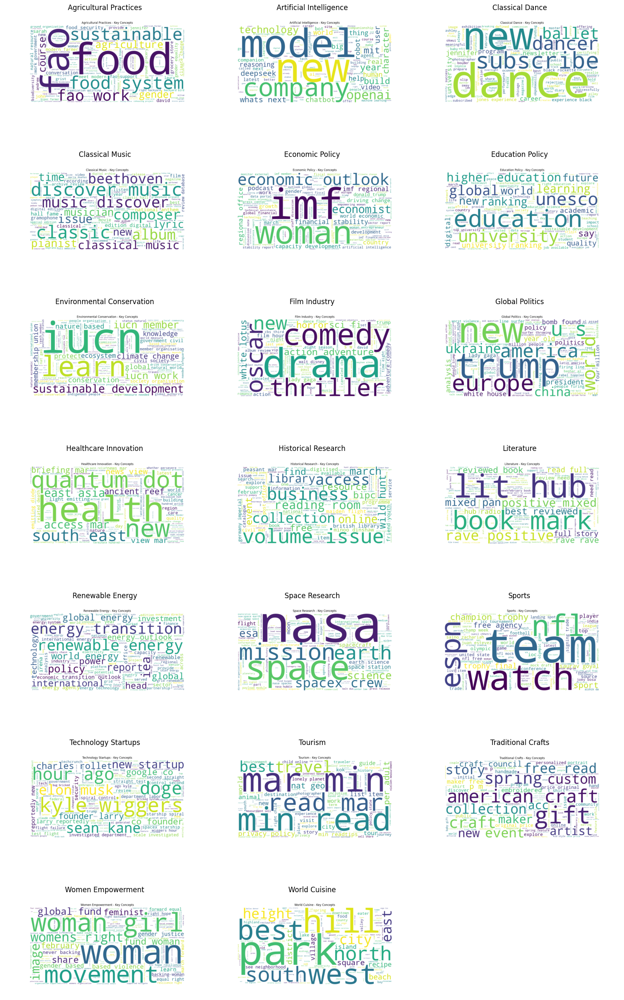

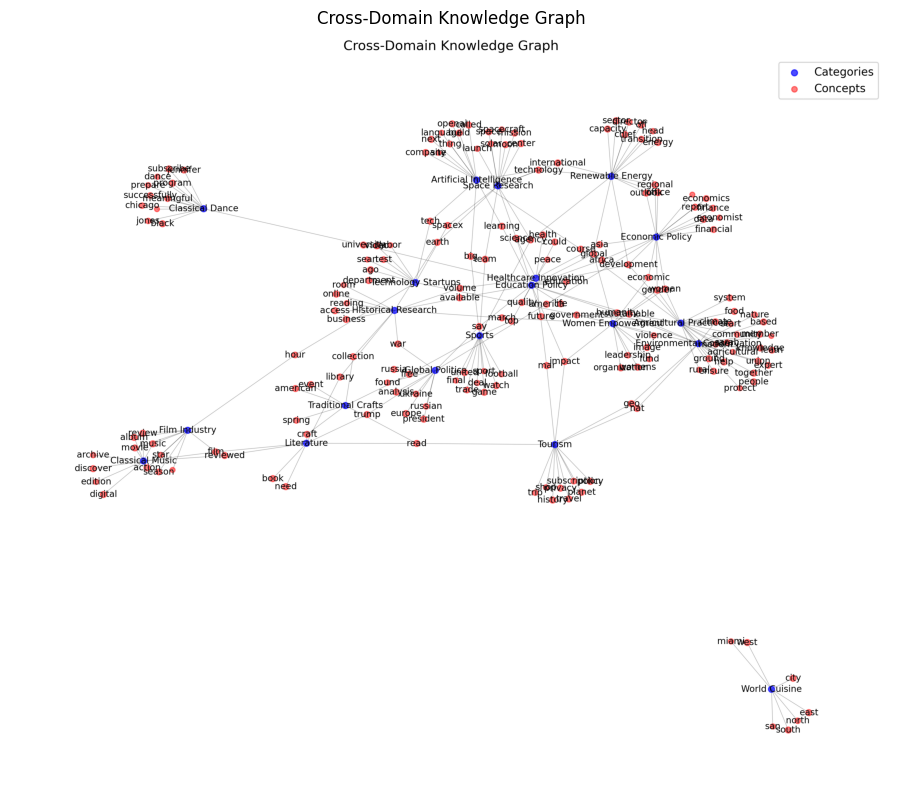

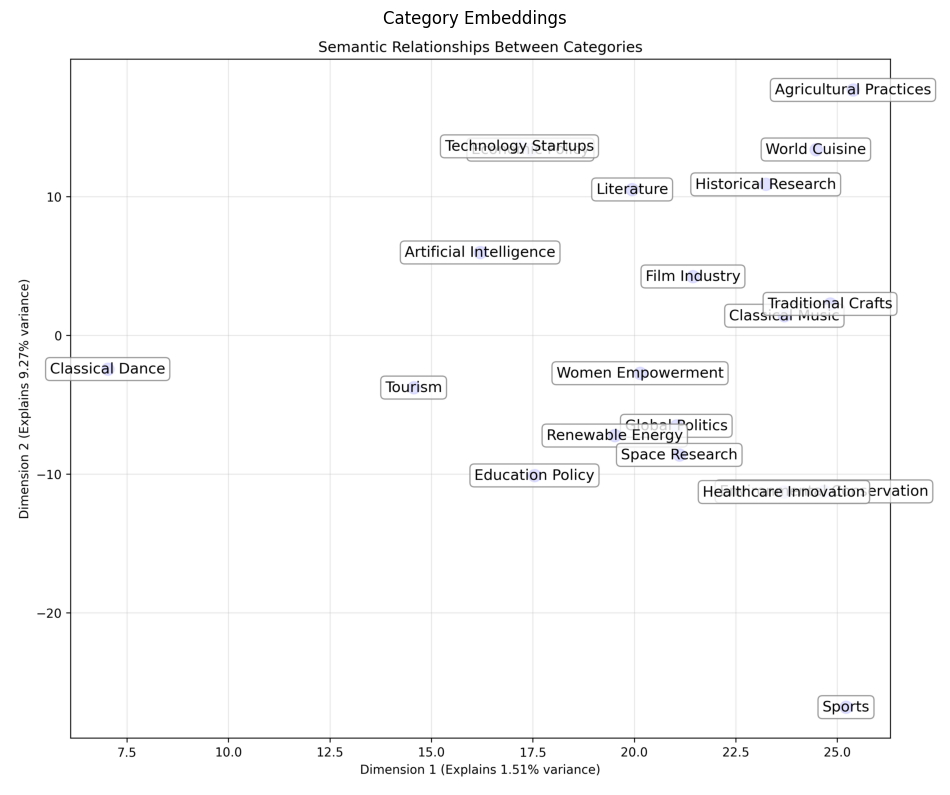

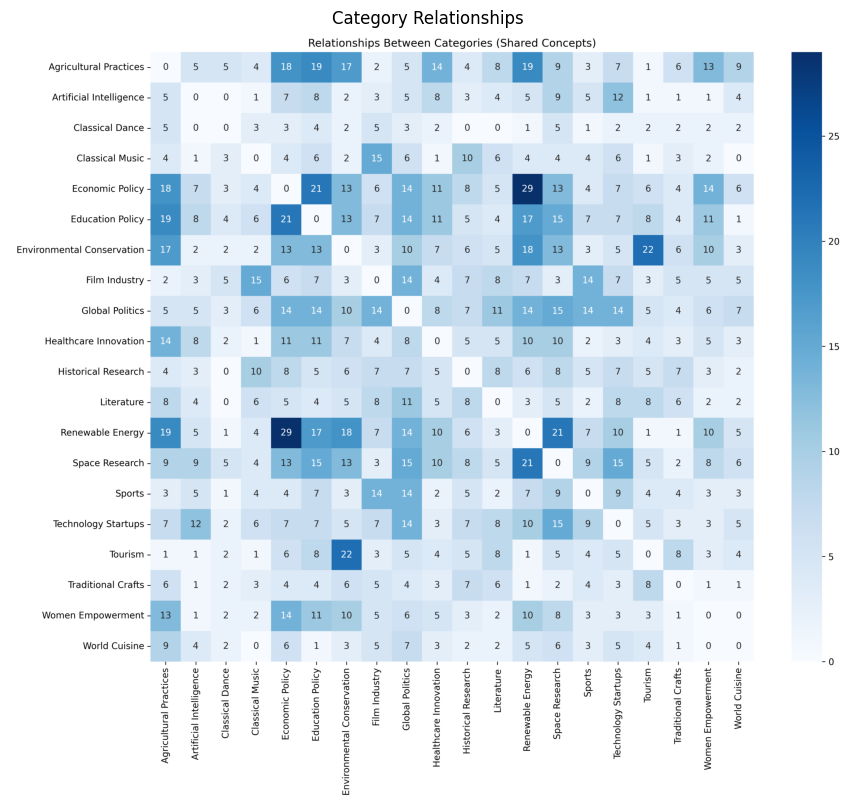

# Cross-Domain Knowledge Analysis Report

## Summary

- **Total Categories Analyzed:** 20
- **Total Concepts Extracted:** 500
- **Knowledge Graph Size:** 200 nodes, 243 connections

## Categories Analyzed

- Agricultural Practices
- Artificial Intelligence
- Classical Dance
- Classical Music
- Economic Policy
- Education Policy
- Environmental Conservation
- Film Industry
- Global Politics
- Healthcare Innovation
- Historical Research
- Literature
- Renewable Energy
- Space Research
- Sports
- Technology Startups
- Tourism
- Traditional Crafts
- Women Empowerment
- World Cuisine

## Category Analysis

### Agricultural Practices

#### Key Concepts

- food *(score: 0.4577)*
- farm *(score: 0.2218)*
- farmer *(score: 0.2195)*
- rural *(score: 0.1718)*
- agriculture *(score: 0.1702)*
- community *(score: 0.1255)*
- agricultural *(score: 0.1238)*
- gender *(score: 0.1213)*
- system *(score: 0.1191)*
- start *(score: 0.1095)*

#### Cross-Domain Connections

- **Artificial Intelligence**: help (8)
- **Classical Music**: start (4)
- **Economic Policy**: gender (32), climate (17), government (11), woman (5), agriculture (4)
- **Education Policy**: sustainable (15), gender (7), ensure (5), system (4), climate (4)
- **Environmental Conservation**: sustainable (39), government (21), climate (21), help (12), food (8)
- **Film Industry**: gender (6)
- **Global Politics**: government (14), climate (7), sustainable (6)
- **Healthcare Innovation**: help (7), climate (6), gender (5), woman (4), modern (4)
- **Historical Research**: start (5), help (5)
- **Literature**: food (7), government (4), help (4), modern (3), climate (3)
- **Renewable Energy**: sustainable (25), climate (25), government (11), system (10), ensure (10)
- **Space Research**: system (18), climate (15), ground (10), help (10), ensure (4)
- **Technology Startups**: government (42), sarah (14), help (6), system (4), ground (3)
- **Traditional Crafts**: community (5), sustainable (4), garden (4)
- **Women Empowerment**: gender (25), sustainable (7), ground (6), ensure (6), woman (6)
- **World Cuisine**: food (19), garden (3)

### Artificial Intelligence

#### Key Concepts

- model *(score: 0.3306)*
- openai *(score: 0.2301)*
- company *(score: 0.1780)*
- character *(score: 0.1757)*
- technology *(score: 0.1689)*
- whats *(score: 0.1639)*
- robot *(score: 0.1437)*
- companion *(score: 0.1416)*
- bot *(score: 0.1416)*
- next *(score: 0.1376)*

#### Cross-Domain Connections

- **Agricultural Practices**: course (23), build (10), thing (9), learning (5)
- **Economic Policy**: technology (12), site (8), learning (7), course (4), big (3)
- **Education Policy**: learning (27), language (6), build (6), technology (5)
- **Environmental Conservation**: relationship (8)
- **Film Industry**: big (22), thing (8), next (3)
- **Global Politics**: next (10), company (8), technology (6), tech (6)
- **Healthcare Innovation**: called (8), learning (7), machine (7), language (5), model (3)
- **Historical Research**: company (3)
- **Literature**: technology (6)
- **Renewable Energy**: technology (31), next (9), company (4)
- **Space Research**: technology (48), next (18), whats (9), learning (6), called (5)
- **Sports**: big (21), next (6)
- **Technology Startups**: tech (35), openai (19), big (11), company (7), next (7)
- **World Cuisine**: next (3), tech (3)

### Classical Dance

#### Key Concepts

- dance *(score: 0.6684)*
- dancer *(score: 0.2513)*
- jennifer *(score: 0.2010)*
- jones *(score: 0.1381)*
- subscribe *(score: 0.1329)*
- successfully *(score: 0.1114)*
- diary *(score: 0.1114)*
- rejection *(score: 0.1114)*
- audition *(score: 0.1114)*
- defined *(score: 0.1114)*

#### Cross-Domain Connections

- **Agricultural Practices**: jennifer (10), ashley (5), university (4), jones (3), program (3)
- **Classical Music**: jones (5), university (4), subscribe (3)
- **Economic Policy**: program (8), edge (3), university (3)
- **Education Policy**: university (30), subscribe (3), teacher (3)
- **Environmental Conservation**: subscribe (3), photographer (3)
- **Film Industry**: dance (12), black (12), jennifer (8), chicago (7), jones (6)
- **Global Politics**: subscribe (8), meaningful (7), black (5)
- **Healthcare Innovation**: rejection (5), defined (4)
- **Renewable Energy**: university (20)
- **Space Research**: successfully (15), program (12), prepare (9), university (9), black (3)
- **Sports**: prepare (4)
- **Technology Startups**: program (8), subscribe (4)
- **Tourism**: subscribe (4), photographer (3)
- **Traditional Crafts**: baby (10), meaningful (3)
- **Women Empowerment**: meaningful (5), program (4)
- **World Cuisine**: university (12), chicago (7)

### Classical Music

#### Key Concepts

- music *(score: 0.5766)*
- classic *(score: 0.3915)*
- album *(score: 0.2529)*
- recording *(score: 0.2127)*
- composer *(score: 0.2030)*
- discover *(score: 0.1893)*
- anthem *(score: 0.1257)*
- edition *(score: 0.1228)*
- fame *(score: 0.1160)*
- hall *(score: 0.1047)*

#### Cross-Domain Connections

- **Agricultural Practices**: archive (5), discover (4), reviewed (4)
- **Artificial Intelligence**: digital (4)
- **Economic Policy**: digital (14), review (9), discover (3), listen (3)
- **Education Policy**: digital (12), discover (5)
- **Film Industry**: film (50), review (38), music (27), album (21), movie (15)
- **Global Politics**: film (7), music (6), album (6), fame (6), review (4)
- **Healthcare Innovation**: digital (4)
- **Historical Research**: review (5), film (5), edition (4), archive (4), digital (4)
- **Literature**: reviewed (18), film (11), music (8)
- **Renewable Energy**: edition (8), review (4)
- **Space Research**: digital (7), complete (5), discover (3), database (3)
- **Sports**: complete (3), player (3)
- **Technology Startups**: review (9), digital (9), archive (4), listen (3)
- **Traditional Crafts**: discover (9), digital (6)

### Economic Policy

#### Key Concepts

- financial *(score: 0.2605)*
- economic *(score: 0.2273)*
- woman *(score: 0.2224)*
- outlook *(score: 0.2223)*
- note *(score: 0.1736)*
- stability *(score: 0.1681)*
- report *(score: 0.1648)*
- office *(score: 0.1516)*
- regional *(score: 0.1483)*
- development *(score: 0.1411)*

#### Cross-Domain Connections

- **Agricultural Practices**: gender (31), development (15), data (11), economic (7), country (7)
- **Artificial Intelligence**: data (5)
- **Education Policy**: development (17), africa (10), data (8), gender (7), report (5)
- **Environmental Conservation**: development (28), economic (8), finance (5), gender (5), economics (4)
- **Film Industry**: america (10), financial (6), gender (6), report (5), office (4)
- **Global Politics**: america (21), africa (12), asia (7), economic (3), office (3)
- **Healthcare Innovation**: asia (12), regional (11), development (5), gender (5), data (5)
- **Historical Research**: office (7), america (4)
- **Renewable Energy**: outlook (44), development (28), regional (27), office (24), report (20)
- **Space Research**: development (20), data (20), america (14), asia (6), africa (6)
- **Sports**: report (4)
- **Technology Startups**: data (14), report (5), housing (3)
- **Women Empowerment**: gender (25), economic (13), woman (6), report (6), development (6)
- **World Cuisine**: financial (3)

### Education Policy

#### Key Concepts

- education *(score: 0.7791)*
- university *(score: 0.2828)*
- ranking *(score: 0.2571)*
- higher *(score: 0.1307)*
- learning *(score: 0.1137)*
- global *(score: 0.1015)*
- development *(score: 0.0716)*
- quality *(score: 0.0708)*
- job *(score: 0.0665)*
- peace *(score: 0.0558)*

#### Cross-Domain Connections

- **Agricultural Practices**: sustainable (30), development (15), global (12), future (12), quality (11)
- **Artificial Intelligence**: learning (12), future (4), top (4), say (3)
- **Classical Dance**: university (3)
- **Classical Music**: life (5), university (4), global (3), humanity (3)
- **Economic Policy**: development (44), global (32), africa (18), future (11), job (9)
- **Environmental Conservation**: sustainable (39), development (28), global (22), humanity (16), science (14)
- **Film Industry**: life (10), say (8), global (6), future (5), peace (4)
- **Global Politics**: africa (12), future (10), global (9), science (7), life (6)
- **Healthcare Innovation**: science (17), life (12), future (9), quality (8), learning (7)
- **Historical Research**: available (10), impact (3)
- **Literature**: science (8), life (7)
- **Renewable Energy**: global (65), development (28), sustainable (25), university (20), africa (18)
- **Space Research**: science (75), development (20), future (14), global (13), top (12)
- **Sports**: top (18), ranking (6), available (6), say (3)
- **Technology Startups**: top (17), science (15), global (6), life (4), available (4)
- **Tourism**: impact (7)
- **Traditional Crafts**: life (7), sustainable (4), impact (3)
- **Women Empowerment**: impact (20), global (15), sustainable (7), development (6), peace (6)
- **World Cuisine**: university (12)

### Environmental Conservation

#### Key Concepts

- conservation *(score: 0.3551)*
- nature *(score: 0.3366)*
- ecosystem *(score: 0.2305)*
- organisation *(score: 0.2066)*
- union *(score: 0.1890)*
- member *(score: 0.1718)*
- sustainable *(score: 0.1640)*
- development *(score: 0.1386)*
- humanity *(score: 0.1384)*
- learn *(score: 0.1374)*

#### Cross-Domain Connections

- **Agricultural Practices**: sustainable (30), climate (22), development (15), people (14), government (9)
- **Artificial Intelligence**: people (6)
- **Classical Music**: organisation (3), humanity (3)
- **Economic Policy**: development (44), climate (17), government (11), based (7), union (6)
- **Education Policy**: development (17), sustainable (15), knowledge (4), climate (4), together (3)
- **Film Industry**: union (8), people (5)
- **Global Politics**: people (19), government (14), climate (7), conservation (6), sustainable (6)
- **Healthcare Innovation**: nature (13), based (13), climate (6), development (5), people (5)
- **Historical Research**: people (10)
- **Literature**: member (7), people (5), government (4), climate (3)
- **Renewable Energy**: development (28), sustainable (25), climate (25), member (12), government (11)
- **Space Research**: development (20), climate (15), together (7), sustainable (4), people (4)
- **Technology Startups**: government (42), people (7), based (4), protect (3)
- **Tourism**: nat (10), geo (10), learn (3), based (3), protect (3)
- **Traditional Crafts**: learn (6), people (5), sustainable (4), membership (4), together (3)
- **Women Empowerment**: based (10), learn (9), sustainable (7), development (6)
- **World Cuisine**: union (6), expert (4), together (3)

### Film Industry

#### Key Concepts

- drama *(score: 0.3068)*
- comedy *(score: 0.2518)*
- oscar *(score: 0.2316)*
- horror *(score: 0.2106)*
- thriller *(score: 0.2066)*
- adventure *(score: 0.1590)*
- film *(score: 0.1588)*
- action *(score: 0.1246)*
- hollywood *(score: 0.1239)*
- win *(score: 0.1206)*

#### Cross-Domain Connections

- **Agricultural Practices**: action (5)
- **Classical Music**: music (78), album (21), film (10), review (9), oscar (5)
- **Economic Policy**: review (9)
- **Education Policy**: action (6)
- **Environmental Conservation**: action (17)
- **Global Politics**: gaga (10), lady (10), film (7), win (7), music (6)
- **Healthcare Innovation**: season (8), exclusive (7), action (4)
- **Historical Research**: film (5), hour (5), review (5)
- **Literature**: film (11), music (8)
- **Renewable Energy**: action (16), review (4)
- **Space Research**: action (3)
- **Sports**: season (5), star (4), exclusive (3)
- **Technology Startups**: action (9), review (9)
- **Traditional Crafts**: studio (3)
- **Women Empowerment**: action (10)
- **World Cuisine**: hollywood (7), star (3)

### Global Politics

#### Key Concepts

- trump *(score: 0.3813)*
- bbc *(score: 0.2481)*
- president *(score: 0.1810)*
- europe *(score: 0.1350)*
- found *(score: 0.1222)*
- america *(score: 0.1204)*
- china *(score: 0.1182)*
- gaza *(score: 0.1159)*
- ukraine *(score: 0.1080)*
- russian *(score: 0.1001)*

#### Cross-Domain Connections

- **Agricultural Practices**: found (3), say (3)
- **Artificial Intelligence**: say (3)
- **Economic Policy**: europe (25), america (18), trump (10), found (4), ukraine (4)
- **Education Policy**: europe (7), say (7), america (5), gaza (3)
- **Environmental Conservation**: analysis (8), war (4), red (4)
- **Film Industry**: trump (16), war (14), america (10), president (9), say (8)
- **Healthcare Innovation**: analysis (12), trump (5), europe (3), gaza (3)
- **Historical Research**: war (27), america (4)
- **Literature**: trump (12), war (7), ukraine (5), russia (4), gaza (3)
- **Renewable Energy**: analysis (11), wind (10), ukraine (8), america (7), europe (6)
- **Space Research**: america (14), president (12), europe (10), russia (6), china (5)
- **Sports**: league (7), canada (6), president (4), found (3), say (3)
- **Technology Startups**: trump (21), russian (11), war (4), russia (4), analysis (3)
- **Traditional Crafts**: found (4)
- **Women Empowerment**: president (6)
- **World Cuisine**: red (3)

### Healthcare Innovation

#### Key Concepts

- mar *(score: 0.2992)*
- health *(score: 0.2798)*
- cell *(score: 0.1889)*
- quantum *(score: 0.1690)*
- dot *(score: 0.1491)*
- disease *(score: 0.1315)*
- briefing *(score: 0.1166)*
- pain *(score: 0.1094)*
- reef *(score: 0.1094)*
- science *(score: 0.1091)*

#### Cross-Domain Connections

- **Agricultural Practices**: could (21), health (6), ancient (5), disease (3), science (3)
- **Artificial Intelligence**: could (8)
- **Economic Policy**: asia (25), health (7), could (7)
- **Education Policy**: science (13), asia (5), health (3)
- **Environmental Conservation**: science (14), mar (8)
- **Film Industry**: mar (9)
- **Global Politics**: could (22), health (8), science (7), asia (7)
- **Historical Research**: volume (32), ancient (5)
- **Literature**: science (8)
- **Renewable Energy**: related (6), asia (6), science (4), enhancing (3)
- **Space Research**: science (75), health (6), scientific (6), asia (6), scientist (4)
- **Sports**: could (11)
- **Technology Startups**: could (19), science (15), health (11)
- **Tourism**: mar (32)
- **Women Empowerment**: health (3)
- **World Cuisine**: coral (3)

### Historical Research

#### Key Concepts

- volume *(score: 0.4258)*
- library *(score: 0.2086)*
- war *(score: 0.2005)*
- business *(score: 0.1938)*
- collection *(score: 0.1652)*
- reading *(score: 0.1526)*
- march *(score: 0.1207)*
- pope *(score: 0.1198)*
- imperial *(score: 0.1198)*
- room *(score: 0.1190)*

#### Cross-Domain Connections

- **Agricultural Practices**: access (18), business (5)
- **Artificial Intelligence**: wild (3), online (3)
- **Classical Music**: access (7), march (5), library (3), british (3), london (3)
- **Economic Policy**: march (24), access (14), business (9), reading (6), online (6)
- **Education Policy**: available (10), march (9), access (6)
- **Environmental Conservation**: war (4), business (4), access (4), room (3), online (3)
- **Film Industry**: business (16), war (14), collection (5), british (3)
- **Global Politics**: war (25), business (15), pope (6), earth (4), access (3)
- **Healthcare Innovation**: volume (9), access (4), available (4)
- **Literature**: march (16), war (7), reading (7), library (6), room (3)
- **Renewable Energy**: access (12), march (4), british (4), london (4)
- **Space Research**: earth (66), march (25), business (8), library (3), access (3)
- **Sports**: march (7), available (6), room (3)
- **Technology Startups**: business (11), access (11), online (10), war (4), march (4)
- **Tourism**: room (3), online (3)
- **Traditional Crafts**: collection (8), online (7)
- **Women Empowerment**: march (15)
- **World Cuisine**: bread (5), london (3)

### Literature

#### Key Concepts

- lit *(score: 0.4119)*
- hub *(score: 0.3423)*
- book *(score: 0.2837)*
- literary *(score: 0.1961)*
- pan *(score: 0.1961)*
- positive *(score: 0.1947)*
- fiction *(score: 0.1416)*
- criticism *(score: 0.1373)*
- reviewed *(score: 0.1350)*
- read *(score: 0.1186)*

#### Cross-Domain Connections

- **Agricultural Practices**: reviewed (4), mark (4), need (3)
- **Artificial Intelligence**: book (3), read (3), need (3)
- **Classical Music**: reviewed (10), film (10), library (3)
- **Economic Policy**: trump (10), read (6), bookstore (6), book (5), need (5)
- **Education Policy**: read (4), need (4)
- **Environmental Conservation**: book (3)
- **Film Industry**: film (50), trump (16), need (5), book (4), novel (3)
- **Global Politics**: trump (72), read (8), film (7), book (4), daily (3)
- **Healthcare Innovation**: read (5), trump (5), novel (3), need (3)
- **Historical Research**: library (18), read (6), film (5)
- **Renewable Energy**: need (3)
- **Space Research**: hub (4), library (3)
- **Sports**: need (3)
- **Technology Startups**: trump (21), need (6), read (4), fiction (3), rss (3)
- **Tourism**: read (34), book (3)
- **Traditional Crafts**: craft (76), read (18), hub (4)
- **World Cuisine**: need (4), pan (3)

### Renewable Energy

#### Key Concepts

- energy *(score: 0.6917)*
- renewable *(score: 0.2462)*
- transition *(score: 0.2292)*
- outlook *(score: 0.2224)*
- iea *(score: 0.2224)*
- global *(score: 0.1115)*
- grid *(score: 0.1083)*
- chief *(score: 0.0849)*
- technology *(score: 0.0796)*
- international *(score: 0.0772)*

#### Cross-Domain Connections

- **Agricultural Practices**: development (15), sector (15), global (12), director (6), energy (5)
- **Artificial Intelligence**: technology (11), off (3)
- **Classical Music**: global (3), director (3)
- **Economic Policy**: development (44), regional (41), office (38), outlook (34), global (32)
- **Education Policy**: global (33), development (17), international (11), technology (5), cooperation (5)
- **Environmental Conservation**: development (28), global (22), international (12), transition (4), agency (4)
- **Film Industry**: director (17), off (17), global (6), head (6), office (4)
- **Global Politics**: global (9), off (7), technology (6), head (4), energy (3)
- **Healthcare Innovation**: regional (11), director (6), development (5), global (4), chief (4)
- **Historical Research**: office (7), international (6)
- **Literature**: technology (6), international (4)
- **Space Research**: technology (48), international (40), agency (20), development (20), global (13)
- **Sports**: agency (20), international (18), off (4)
- **Technology Startups**: chief (18), agency (7), off (7), energy (6), global (6)
- **Traditional Crafts**: off (30)
- **Women Empowerment**: global (15), international (7), energy (6), renewable (6), transition (6)
- **World Cuisine**: off (9), director (4)

### Space Research

#### Key Concepts

- nasa *(score: 0.7361)*
- space *(score: 0.3027)*
- earth *(score: 0.1940)*
- science *(score: 0.1347)*
- mission *(score: 0.1210)*
- launch *(score: 0.1120)*
- crew *(score: 0.1093)*
- moon *(score: 0.1001)*
- technology *(score: 0.0972)*
- exploration *(score: 0.0967)*

#### Cross-Domain Connections

- **Agricultural Practices**: international (4), science (3), launch (3)
- **Artificial Intelligence**: technology (11)
- **Economic Policy**: international (16), center (15), technology (12), mission (7), team (3)
- **Education Policy**: science (13), international (11), technology (5), agency (4)
- **Environmental Conservation**: science (14), international (12), space (6), mission (4), agency (4)
- **Film Industry**: team (5), crew (4)
- **Global Politics**: moon (9), science (7), spacex (7), technology (6), station (6)
- **Healthcare Innovation**: science (17), center (9), moon (4), international (3)
- **Historical Research**: earth (9), international (6), team (4)
- **Literature**: science (8), technology (6), international (4)
- **Renewable Energy**: international (45), technology (31), agency (22), solar (14), science (4)
- **Sports**: agency (20), team (19), international (18), center (4)
- **Technology Startups**: spacex (27), science (15), moon (11), spacecraft (10), space (8)
- **Tourism**: mission (3)
- **Women Empowerment**: mission (8), international (7), team (5)
- **World Cuisine**: center (11), mission (5), station (4)

### Sports

#### Key Concepts

- final *(score: 0.2557)*
- olympic *(score: 0.2499)*
- champion *(score: 0.2108)*
- trophy *(score: 0.2078)*
- team *(score: 0.1803)*
- india *(score: 0.1764)*
- trade *(score: 0.1620)*
- watch *(score: 0.1532)*
- football *(score: 0.1517)*
- signing *(score: 0.1417)*

#### Cross-Domain Connections

- **Agricultural Practices**: free (16), top (10), united (3)
- **Artificial Intelligence**: big (8), top (4), watch (3)
- **Classical Music**: final (4), player (3)
- **Economic Policy**: watch (8), team (3), big (3)
- **Education Policy**: top (14), united (9), agency (4)
- **Environmental Conservation**: united (5), agency (4), watch (3)
- **Film Industry**: big (22), watch (10), spot (8), champion (6), game (6)
- **Global Politics**: united (12), football (10), trade (9), watch (8), sport (8)
- **Healthcare Innovation**: free (5)
- **Historical Research**: free (9), team (4)
- **Literature**: draft (6)
- **Renewable Energy**: agency (22), trade (8), team (4), united (3)
- **Space Research**: team (23), agency (20), top (12), free (4), big (4)
- **Technology Startups**: watch (22), top (17), game (16), big (11), agency (7)
- **Tourism**: watch (3)
- **Traditional Crafts**: free (27)
- **Women Empowerment**: team (5)

### Technology Startups

#### Key Concepts

- startup *(score: 0.3274)*
- kyle *(score: 0.2790)*
- reportedly *(score: 0.2273)*
- doge *(score: 0.2133)*
- google *(score: 0.1804)*
- ago *(score: 0.1568)*
- founder *(score: 0.1460)*
- sean *(score: 0.1455)*
- kane *(score: 0.1455)*
- hour *(score: 0.1454)*

#### Cross-Domain Connections

- **Agricultural Practices**: government (9), charles (3)
- **Artificial Intelligence**: video (7), tech (7), user (4)
- **Classical Music**: video (5), hour (3)
- **Economic Policy**: government (11), labor (4), department (3), tech (3)
- **Education Policy**: department (3)
- **Environmental Conservation**: government (21)
- **Film Industry**: video (19), ago (16), sean (11), labor (7), charles (5)
- **Global Politics**: government (14), video (12), ago (8), starship (8), test (8)
- **Historical Research**: hour (5)
- **Literature**: musk (4), government (4), elon (3)
- **Renewable Energy**: government (11), department (8), video (4)
- **Space Research**: spacex (27), video (11), department (10), test (8), tech (3)
- **Sports**: kyle (6)
- **World Cuisine**: video (3), tech (3)

### Tourism

#### Key Concepts

- min *(score: 0.7190)*
- mar *(score: 0.3670)*
- read *(score: 0.2455)*
- nat *(score: 0.1672)*
- geo *(score: 0.1672)*
- adult *(score: 0.1509)*
- travel *(score: 0.1285)*
- per *(score: 0.1191)*
- privacy *(score: 0.0935)*
- visit *(score: 0.0834)*

#### Cross-Domain Connections

- **Agricultural Practices**: policy (11)
- **Artificial Intelligence**: read (3)
- **Classical Music**: subscription (4)
- **Economic Policy**: policy (12), history (10), read (6), impact (6), planet (3)
- **Education Policy**: impact (11), per (7), planet (6), read (4), adult (3)
- **Environmental Conservation**: policy (22), planet (15), impact (12), history (12), nat (10)
- **Film Industry**: history (12), trip (10), mar (9)
- **Global Politics**: policy (14), read (8), impact (6), travel (5), history (4)
- **Healthcare Innovation**: mar (48), read (5), privacy (3)
- **Historical Research**: history (12), read (6), impact (3)
- **Literature**: read (28), history (15), travel (6), tour (4), privacy (3)
- **Renewable Energy**: policy (20)
- **Space Research**: history (18), policy (12), planet (9), travel (7)
- **Sports**: policy (4), privacy (3), tour (3)
- **Technology Startups**: policy (9), read (4), travel (4), privacy (4), subscription (3)
- **Traditional Crafts**: read (18), history (10), privacy (5), shop (4), travel (3)
- **Women Empowerment**: impact (20), history (5)
- **World Cuisine**: shop (5), travel (3)

### Traditional Crafts

#### Key Concepts

- craft *(score: 0.5352)*
- gift *(score: 0.4709)*
- spring *(score: 0.3029)*
- maker *(score: 0.2294)*
- artist *(score: 0.1476)*
- acc *(score: 0.1429)*
- custom *(score: 0.1366)*
- american *(score: 0.1364)*
- free *(score: 0.1140)*
- exhibition *(score: 0.0986)*

#### Cross-Domain Connections

- **Agricultural Practices**: free (16), american (10), event (4)
- **Artificial Intelligence**: read (3)
- **Classical Music**: american (5)
- **Economic Policy**: spring (6), read (6), american (3), price (3)
- **Education Policy**: read (4)
- **Environmental Conservation**: event (3)
- **Film Industry**: original (7), collection (5), free (4), american (3)
- **Global Politics**: read (8), free (5), american (3)
- **Healthcare Innovation**: american (5), free (5), read (5)
- **Historical Research**: collection (17), free (9), read (6), american (5), spring (3)
- **Literature**: read (28), craft (13), american (7)
- **Space Research**: free (4), material (3)
- **Sports**: free (25), event (4), acc (3)
- **Technology Startups**: event (7), price (4), read (4)
- **Tourism**: read (34), event (3)
- **World Cuisine**: spring (8)

### Women Empowerment

#### Key Concepts

- woman *(score: 0.4296)*
- womens *(score: 0.3587)*
- justice *(score: 0.2158)*
- movement *(score: 0.1925)*
- gender *(score: 0.1879)*
- girl *(score: 0.1746)*
- leadership *(score: 0.1685)*
- violence *(score: 0.1586)*
- organization *(score: 0.1541)*
- humanitarian *(score: 0.1515)*

#### Cross-Domain Connections

- **Agricultural Practices**: gender (31), global (12), economic (7), organization (4), equal (4)
- **Artificial Intelligence**: image (3)
- **Classical Music**: march (5), global (3)
- **Economic Policy**: economic (75), gender (32), global (32), march (24), womens (18)
- **Education Policy**: global (33), impact (11), march (9), gender (7), womens (4)
- **Environmental Conservation**: global (22), impact (12), economic (8), gender (5), justice (4)
- **Film Industry**: image (8), gender (6), global (6), womens (3)
- **Global Politics**: violence (10), global (9), impact (6), hope (5), economic (3)
- **Healthcare Innovation**: gender (5), woman (4), supported (4), global (4)
- **Historical Research**: march (21), impact (3)
- **Literature**: march (16), violence (4)
- **Renewable Energy**: global (65), economic (12), leadership (4), march (4)
- **Space Research**: march (25), organization (17), image (14), global (13), fund (4)
- **Sports**: march (7), movement (6)
- **Technology Startups**: global (6), fund (4), march (4)
- **Tourism**: impact (7)
- **Traditional Crafts**: impact (3)

### World Cuisine

#### Key Concepts

- park *(score: 0.5014)*
- hill *(score: 0.3381)*
- west *(score: 0.2070)*
- height *(score: 0.2049)*
- recipe *(score: 0.1932)*
- district *(score: 0.1796)*
- square *(score: 0.1756)*
- beach *(score: 0.1645)*
- village *(score: 0.1522)*
- south *(score: 0.1407)*

#### Cross-Domain Connections

- **Agricultural Practices**: west (8), city (7), district (3), north (3), san (3)
- **Artificial Intelligence**: city (4), west (3)
- **Economic Policy**: city (9), east (8), south (5), downtown (4), island (3)
- **Film Industry**: west (4), east (4), island (3)
- **Global Politics**: south (10), east (8), north (6), beach (4), miami (4)
- **Healthcare Innovation**: south (12), east (12)
- **Renewable Energy**: south (6), san (3), island (3)
- **Space Research**: south (6), north (6), east (6)
- **Sports**: miami (8), west (5), dallas (4)
- **Technology Startups**: san (6), city (3), valley (3)
- **Tourism**: city (4), south (3)

## Similar Categories

### Agricultural Practices is most similar to:

- World Cuisine *(similarity: 0.3198)*
- Traditional Crafts *(similarity: 0.3080)*
- Women Empowerment *(similarity: 0.2937)*

### Artificial Intelligence is most similar to:

- Technology Startups *(similarity: 0.3609)*
- Space Research *(similarity: 0.2478)*
- Renewable Energy *(similarity: 0.2373)*

### Classical Dance is most similar to:

- Women Empowerment *(similarity: 0.5268)*
- Traditional Crafts *(similarity: 0.4493)*
- Classical Music *(similarity: 0.4064)*

### Classical Music is most similar to:

- Classical Dance *(similarity: 0.4064)*
- Traditional Crafts *(similarity: 0.3279)*
- Tourism *(similarity: 0.3215)*

### Economic Policy is most similar to:

- Women Empowerment *(similarity: 0.3618)*
- Agricultural Practices *(similarity: 0.2820)*
- World Cuisine *(similarity: 0.2405)*

### Education Policy is most similar to:

- Classical Dance *(similarity: 0.3236)*
- Women Empowerment *(similarity: 0.3006)*
- Healthcare Innovation *(similarity: 0.2642)*

### Environmental Conservation is most similar to:

- Tourism *(similarity: 0.7056)*
- Women Empowerment *(similarity: 0.4040)*
- Traditional Crafts *(similarity: 0.3600)*

### Film Industry is most similar to:

- Traditional Crafts *(similarity: 0.2723)*
- Classical Dance *(similarity: 0.2463)*
- Classical Music *(similarity: 0.2306)*

### Global Politics is most similar to:

- Literature *(similarity: 0.2652)*
- Sports *(similarity: 0.2516)*
- Classical Dance *(similarity: 0.2458)*

### Healthcare Innovation is most similar to:

- Environmental Conservation *(similarity: 0.2812)*
- Women Empowerment *(similarity: 0.2748)*
- Education Policy *(similarity: 0.2642)*

### Historical Research is most similar to:

- Traditional Crafts *(similarity: 0.3191)*
- Classical Music *(similarity: 0.3033)*
- Tourism *(similarity: 0.2947)*

### Literature is most similar to:

- Classical Dance *(similarity: 0.3568)*
- Tourism *(similarity: 0.3349)*
- World Cuisine *(similarity: 0.3237)*

### Renewable Energy is most similar to:

- Women Empowerment *(similarity: 0.2808)*
- Sports *(similarity: 0.2655)*
- Artificial Intelligence *(similarity: 0.2373)*

### Space Research is most similar to:

- Environmental Conservation *(similarity: 0.3346)*
- Historical Research *(similarity: 0.2656)*
- Tourism *(similarity: 0.2495)*

### Sports is most similar to:

- Environmental Conservation *(similarity: 0.3328)*
- Tourism *(similarity: 0.3098)*
- Classical Dance *(similarity: 0.2838)*

### Technology Startups is most similar to:

- Artificial Intelligence *(similarity: 0.3609)*
- World Cuisine *(similarity: 0.2771)*
- Classical Music *(similarity: 0.2296)*

### Tourism is most similar to:

- Environmental Conservation *(similarity: 0.7056)*
- World Cuisine *(similarity: 0.4479)*
- Traditional Crafts *(similarity: 0.3640)*

### Traditional Crafts is most similar to:

- Classical Dance *(similarity: 0.4493)*
- Tourism *(similarity: 0.3640)*
- Environmental Conservation *(similarity: 0.3600)*

### Women Empowerment is most similar to:

- Classical Dance *(similarity: 0.5268)*
- Environmental Conservation *(similarity: 0.4040)*
- Economic Policy *(similarity: 0.3618)*

### World Cuisine is most similar to:

- Tourism *(similarity: 0.4479)*
- Environmental Conservation *(similarity: 0.3494)*
- Literature *(similarity: 0.3237)*



In [15]:
# Example usage
if __name__ == "__main__":
    # Create loader with path to analysis folder
    loader = VisualizationLoader("CrossDomainAnalysis")
    
    # Display all available files
    loader.list_all_files()
    
    # Display wordclouds
    loader.display_wordclouds()
    
    # Display knowledge graph
    loader.display_knowledge_graph()
    
    # Display category embeddings
    loader.display_category_embeddings()
    
    # Display category relationships
    loader.display_category_relationships()
    
    # Display report
    loader.display_report()

## Use case

## Audio Dataset

In [1]:
from radio_stream_recorder import RadioSonicArchiveGenerator

# Import additional libraries for analysis
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import time

# Set output directory
output_dir = "radio_sonic_archive"

# Initialize the generator
generator = RadioSonicArchiveGenerator(output_dir)
generator.radio_stations

{'SomaFM_Groove': 'https://ice2.somafm.com/groovesalad-128-mp3',
 'SomaFM_Drone': 'https://ice2.somafm.com/dronezone-128-mp3',
 'SomaFM_Jazz': 'https://ice2.somafm.com/sonicuniverse-128-mp3',
 'SomaFM_Indie': 'https://ice2.somafm.com/indiepop-128-mp3',
 'SomaFM_Folk': 'https://ice2.somafm.com/folkfwd-128-mp3',
 'SomaFM_Ambient': 'https://ice2.somafm.com/spacestation-128-mp3',
 'SomaFM_Lounge': 'https://ice2.somafm.com/lush-128-mp3'}

In [2]:
# Record audio files (reduced number for demo purposes)
num_recordings = 30  # Change to 30 for the full dataset

# Configure recording parameters
generator.record_multiple_segments(
    num_files=num_recordings,
    min_duration=30,  # minimum duration in seconds
    max_duration=90,  # maximum duration in seconds
    file_format="mp3",
    random_stations=True
)

# Get dataset summary
summary = generator.get_dataset_summary()
print(f"Generated {summary.get('total_files', 0)} files from {summary.get('total_stations', 0)} stations")
print(f"Total duration: {summary.get('total_duration', 'unknown')} seconds")

# Show station distribution
if 'stations' in summary:
    print("\nStation Distribution:")
    for station, count in summary.get('stations', {}).items():
        print(f"  - {station}: {count} files")

2025-03-08 21:50:47,069 - INFO - Stream test successful for SomaFM_Groove
2025-03-08 21:50:49,208 - INFO - Stream test successful for SomaFM_Drone
2025-03-08 21:50:51,438 - INFO - Stream test successful for SomaFM_Jazz
2025-03-08 21:50:53,601 - INFO - Stream test successful for SomaFM_Indie
2025-03-08 21:50:55,842 - INFO - Stream test successful for SomaFM_Folk
2025-03-08 21:50:58,006 - INFO - Stream test successful for SomaFM_Ambient
2025-03-08 21:51:00,258 - INFO - Stream test successful for SomaFM_Lounge
2025-03-08 21:51:00,260 - INFO - Found 7 valid radio stations
2025-03-08 21:51:00,314 - INFO - Starting recording: SomaFM_Folk for 59 seconds
2025-03-08 21:51:45,459 - INFO - Recording complete: radio_sonic_archive\001_SomaFM_Folk_20250308_215100.mp3
2025-03-08 21:51:45,819 - INFO - Recorded file 1/30: 001_SomaFM_Folk_20250308_215100.mp3
2025-03-08 21:51:45,825 - INFO - Metadata saved to metadata.csv
2025-03-08 21:51:47,883 - INFO - Starting recording: SomaFM_Lounge for 59 seconds
2

Generated 30 files from 7 stations
Total duration: 1807.8610000000003 seconds

Station Distribution:
  - SomaFM_Lounge: 6 files
  - SomaFM_Drone: 5 files
  - SomaFM_Indie: 5 files
  - SomaFM_Ambient: 5 files
  - SomaFM_Folk: 4 files
  - SomaFM_Jazz: 3 files
  - SomaFM_Groove: 2 files


Loaded metadata with 30 records


,file_id,filename,station_name,url,timestamp,requested_duration,actual_duration,format
0,1,001_SomaFM_Folk_20250308_215100.mp3,SomaFM_Folk,https://ice2.somafm.com/folkfwd-128-mp3,20250308_215100,59,58.999,mp3
1,2,002_SomaFM_Lounge_20250308_215147.mp3,SomaFM_Lounge,https://ice2.somafm.com/lush-128-mp3,20250308_215147,59,58.999,mp3
2,3,003_SomaFM_Drone_20250308_215235.mp3,SomaFM_Drone,https://ice2.somafm.com/dronezone-128-mp3,20250308_215235,60,59.991,mp3
3,4,004_SomaFM_Jazz_20250308_215323.mp3,SomaFM_Jazz,https://ice2.somafm.com/sonicuniverse-128-mp3,20250308_215323,44,44.004,mp3
4,5,005_SomaFM_Indie_20250308_215356.mp3,SomaFM_Indie,https://ice2.somafm.com/indiepop-128-mp3,20250308_215356,37,37.004,mp3


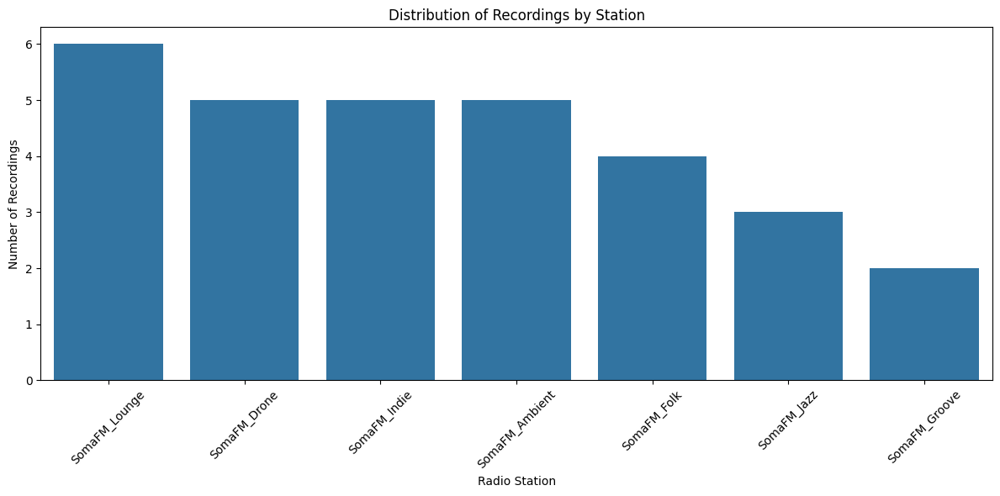

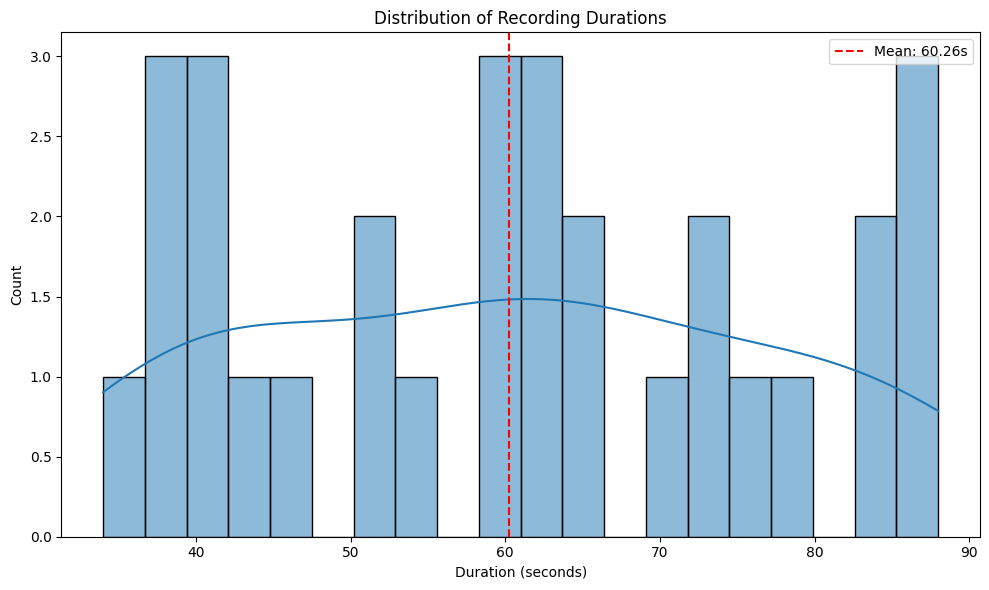

In [3]:
# Load metadata
metadata_file = os.path.join(output_dir, "metadata.csv")

if os.path.exists(metadata_file):
    metadata = pd.read_csv(metadata_file)
    print(f"Loaded metadata with {len(metadata)} records")
    
    # Display the first few rows
    display(metadata.head())
    
    # Plot distribution of recordings by station
    plt.figure(figsize=(12, 6))
    station_counts = metadata['station_name'].value_counts()
    sns.barplot(x=station_counts.index, y=station_counts.values)
    plt.title('Distribution of Recordings by Station')
    plt.xlabel('Radio Station')
    plt.ylabel('Number of Recordings')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
    
    # Distribution of recording durations
    if 'actual_duration' in metadata.columns and metadata['actual_duration'].dtype != object:
        plt.figure(figsize=(10, 6))
        sns.histplot(metadata['actual_duration'], bins=20, kde=True)
        plt.title('Distribution of Recording Durations')
        plt.xlabel('Duration (seconds)')
        plt.ylabel('Count')
        plt.axvline(metadata['actual_duration'].mean(), color='red', linestyle='--', 
                    label=f'Mean: {metadata["actual_duration"].mean():.2f}s')
        plt.legend()
        plt.tight_layout()
        plt.show()
else:
    print(f"Metadata file not found at {metadata_file}")


Analyzing sample file: 001_SomaFM_Folk_20250308_215100.mp3


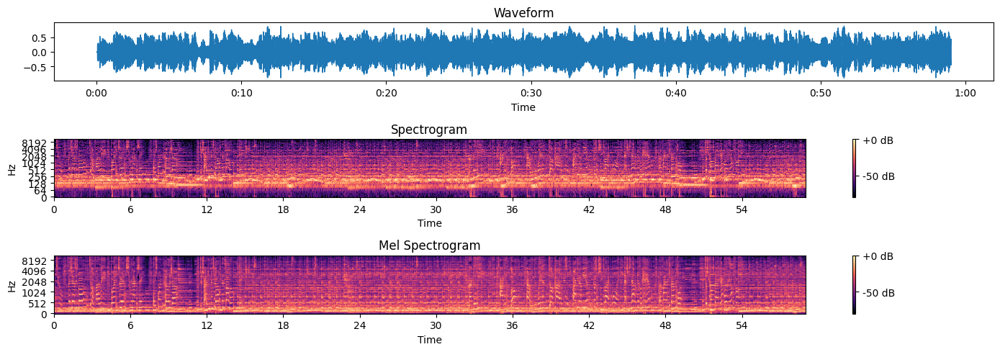

Audio Feature Statistics:
Spectral Centroid Mean: 2106.37
Spectral Rolloff Mean: 4564.82
Zero Crossing Rate Mean: 0.09
MFCC Mean: -0.22

Audio Player:


In [6]:
# Import librosa for audio analysis
import librosa
import librosa.display
import numpy as np
from IPython.display import Audio

# Function to analyze a sample audio file
def analyze_audio_sample(file_path):
    """Analyze a sample audio file and extract basic features"""
    # Load audio file
    y, sr = librosa.load(file_path, sr=22050)
    
    # Display waveform
    plt.figure(figsize=(14, 5))
    plt.subplot(3, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Waveform')
    
    # Display spectrogram
    plt.subplot(3, 1, 2)
    D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
    librosa.display.specshow(D, y_axis='log', x_axis='time', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Spectrogram')
    
    # Display mel spectrogram
    plt.subplot(3, 1, 3)
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128)
    S_dB = librosa.power_to_db(S, ref=np.max)
    librosa.display.specshow(S_dB, x_axis='time', y_axis='mel', sr=sr)
    plt.colorbar(format='%+2.0f dB')
    plt.title('Mel Spectrogram')
    
    plt.tight_layout()
    plt.show()
    
    # Calculate some audio features
    # 1. Spectral Centroid
    spectral_centroids = librosa.feature.spectral_centroid(y=y, sr=sr)[0]
    
    # 2. Spectral Rolloff
    spectral_rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)[0]
    
    # 3. Zero Crossing Rate
    zero_crossing_rate = librosa.feature.zero_crossing_rate(y)[0]
    
    # 4. MFCCs
    mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=13)
    
    # Print feature statistics
    print("Audio Feature Statistics:")
    print(f"Spectral Centroid Mean: {np.mean(spectral_centroids):.2f}")
    print(f"Spectral Rolloff Mean: {np.mean(spectral_rolloff):.2f}")
    print(f"Zero Crossing Rate Mean: {np.mean(zero_crossing_rate):.2f}")
    print(f"MFCC Mean: {np.mean(mfccs):.2f}")
    
    # Play the audio
    print("\nAudio Player:")
    return Audio(y, rate=sr)

# Find an audio file in the dataset
audio_files = [f for f in os.listdir(output_dir) 
              if f.endswith('.mp3') or f.endswith('.wav')]

if audio_files:
    # Select the first file
    sample_file = os.path.join(output_dir, audio_files[0])
    print(f"\nAnalyzing sample file: {audio_files[0]}")
    display(analyze_audio_sample(sample_file))
else:
    print("No audio files found in the dataset directory.")


#### Use Case: Genre Classification Preparation

Let's define a mapping between radio stations and genres, which could be used for training a genre classifier.


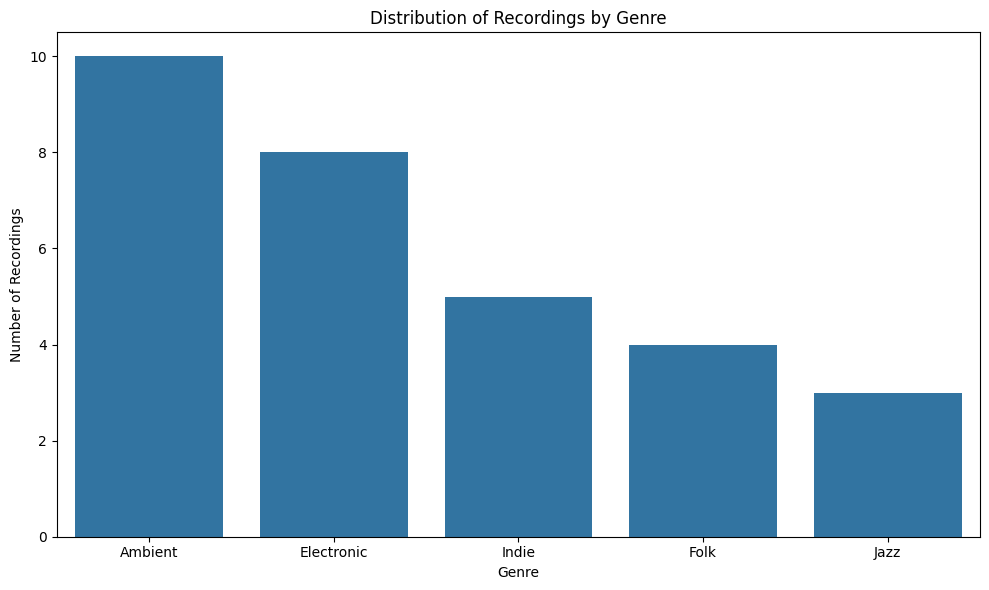

Saved metadata with genre labels to metadata_with_genres.csv


In [7]:
# Define genre mapping for SomaFM stations
genre_mapping = {
    "SomaFM_Groove": "Electronic",
    "SomaFM_Drone": "Ambient",
    "SomaFM_Jazz": "Jazz",
    "SomaFM_Indie": "Indie",
    "SomaFM_Folk": "Folk",
    "SomaFM_Ambient": "Ambient",
    "SomaFM_Lounge": "Electronic"
}

# Add genre to metadata
if 'metadata' in locals():
    metadata['genre'] = metadata['station_name'].map(genre_mapping)
    
    # Count recordings by genre
    genre_counts = metadata['genre'].value_counts()
    
    # Plot recordings by genre
    plt.figure(figsize=(10, 6))
    sns.barplot(x=genre_counts.index, y=genre_counts.values)
    plt.title('Distribution of Recordings by Genre')
    plt.xlabel('Genre')
    plt.ylabel('Number of Recordings')
    plt.tight_layout()
    plt.show()
    
    # Save updated metadata with genre labels
    metadata.to_csv(os.path.join(output_dir, "metadata_with_genres.csv"), index=False)
    print(f"Saved metadata with genre labels to metadata_with_genres.csv")



#### Use Case Demo: Music Mood Analysis

We could also use the dataset for mood analysis. Let's demonstrate a simple approach.

Analyzing mood for 001_SomaFM_Folk_20250308_215100.mp3...
Analyzing mood for 002_SomaFM_Lounge_20250308_215147.mp3...
Analyzing mood for 003_SomaFM_Drone_20250308_215235.mp3...
Analyzing mood for 004_SomaFM_Jazz_20250308_215323.mp3...
Analyzing mood for 005_SomaFM_Indie_20250308_215356.mp3...


,arousal,valence,mood,energy,tempo,file
0,1,1,Excited,1.697203,[99.38401442307692],001_SomaFM_Folk_20250308_215100.mp3
1,1,1,Excited,1.729167,[161.4990234375],002_SomaFM_Lounge_20250308_215147.mp3
2,1,1,Happy,1.562706,[103.359375],003_SomaFM_Drone_20250308_215235.mp3
3,[0.7953263372182846],1,Happy,0.983747,[92.28515625],004_SomaFM_Jazz_20250308_215323.mp3
4,[0.9010615646839142],1,Excited,1.202697,[80.74951171875],005_SomaFM_Indie_20250308_215356.mp3


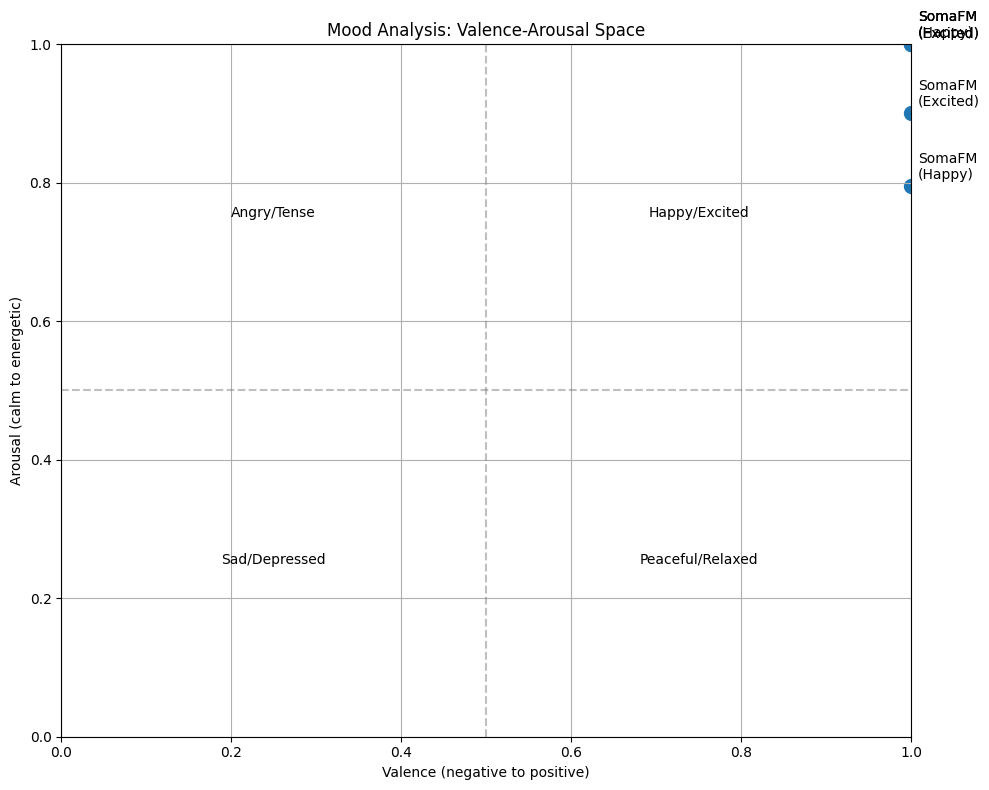

In [8]:
# Function to simulate mood analysis (in a real scenario, you'd use a model)
def analyze_mood(audio_file):
    """Simple simulation of mood analysis based on audio features"""
    # Load audio
    y, sr = librosa.load(audio_file, sr=22050)
    
    # Extract features
    # Energy (RMS)
    rms = librosa.feature.rms(y=y)[0]
    energy = np.mean(rms)
    
    # Tempo
    tempo, _ = librosa.beat.beat_track(y=y, sr=sr)
    
    # Spectral Contrast
    contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
    mean_contrast = np.mean(contrast)
    
    # Map features to mood (simplified)
    energy_score = energy * 10  # Scale for easier interpretation
    tempo_score = tempo / 180  # Normalize to roughly 0-1
    
    # Calculate arousal (energy/activity level)
    arousal = (energy_score * 0.6 + tempo_score * 0.4) 
    
    # Calculate valence (positive vs negative)
    valence = 0.5 + (mean_contrast / 10)  # Center around 0.5
    
    # Clamp values
    arousal = max(0, min(1, arousal))
    valence = max(0, min(1, valence))
    
    # Map to mood quadrants
    moods = {
        'high_valence_high_arousal': ['Excited', 'Happy', 'Energetic'],
        'high_valence_low_arousal': ['Calm', 'Peaceful', 'Relaxed'],
        'low_valence_high_arousal': ['Angry', 'Tense', 'Nervous'],
        'low_valence_low_arousal': ['Sad', 'Depressed', 'Bored']
    }
    
    # Determine quadrant
    if valence >= 0.5 and arousal >= 0.5:
        quadrant = 'high_valence_high_arousal'
    elif valence >= 0.5 and arousal < 0.5:
        quadrant = 'high_valence_low_arousal'
    elif valence < 0.5 and arousal >= 0.5:
        quadrant = 'low_valence_high_arousal'
    else:
        quadrant = 'low_valence_low_arousal'
    
    # Pick a mood from the quadrant
    import random
    mood = random.choice(moods[quadrant])
    
    return {
        'arousal': arousal,
        'valence': valence,
        'mood': mood,
        'energy': energy_score,
        'tempo': tempo
    }

# Analyze mood for a few samples
if audio_files:
    # Take up to 5 files for demonstration
    sample_files = audio_files[:min(5, len(audio_files))]
    
    # Analyze each file
    results = []
    for file in sample_files:
        print(f"Analyzing mood for {file}...")
        file_path = os.path.join(output_dir, file)
        result = analyze_mood(file_path)
        result['file'] = file
        results.append(result)
    
    # Display results
    mood_df = pd.DataFrame(results)
    display(mood_df)
    
    # Plot on valence-arousal space
    plt.figure(figsize=(10, 8))
    plt.scatter(mood_df['valence'], mood_df['arousal'], s=100)
    
    # Add labels
    for i, row in mood_df.iterrows():
        plt.annotate(row['file'].split('_')[1] + f"\n({row['mood']})", 
                     (row['valence'], row['arousal']),
                     xytext=(5, 5), textcoords='offset points')
    
    plt.title('Mood Analysis: Valence-Arousal Space')
    plt.xlabel('Valence (negative to positive)')
    plt.ylabel('Arousal (calm to energetic)')
    plt.xlim(0, 1)
    plt.ylim(0, 1)
    plt.grid(True)
    
    # Add quadrant labels
    plt.text(0.25, 0.25, "Sad/Depressed", ha='center')
    plt.text(0.75, 0.25, "Peaceful/Relaxed", ha='center')
    plt.text(0.25, 0.75, "Angry/Tense", ha='center')
    plt.text(0.75, 0.75, "Happy/Excited", ha='center')
    
    # Add quadrant lines
    plt.axhline(0.5, color='gray', linestyle='--', alpha=0.5)
    plt.axvline(0.5, color='gray', linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.show()




#### 7. Conclusion

In this notebook, we've demonstrated how to:

1. Create a dataset of radio stream recordings
2. Visualize and explore the audio data
3. Extract features for audio analysis
4. Set up genre classification training data
5. Perform mood analysis on the audio

The RadioSonicArchive dataset can be used for various audio analysis tasks, including:
- Genre classification
- Mood detection

## Use case

Loaded metadata with 30 records
Loaded metadata with 30 records
Fixed column 'tempo' by converting from string to float
Loaded features for 30 files
Training genre classification model...
Training the genre classification model...
Evaluating the model...

Classification Report:
              precision    recall  f1-score   support

     Ambient       1.00      1.00      1.00         3
  Electronic       0.50      1.00      0.67         2
        Folk       1.00      1.00      1.00         1
       Indie       1.00      0.50      0.67         2
        Jazz       0.00      0.00      0.00         1

    accuracy                           0.78         9
   macro avg       0.70      0.70      0.67         9
weighted avg       0.78      0.78      0.74         9

Model saved to radio_sonic_archive\genre_classifier_model.joblib
Accuracy: 0.7777777777777778
Feature importance plot saved to radio_sonic_archive\feature_importance.png


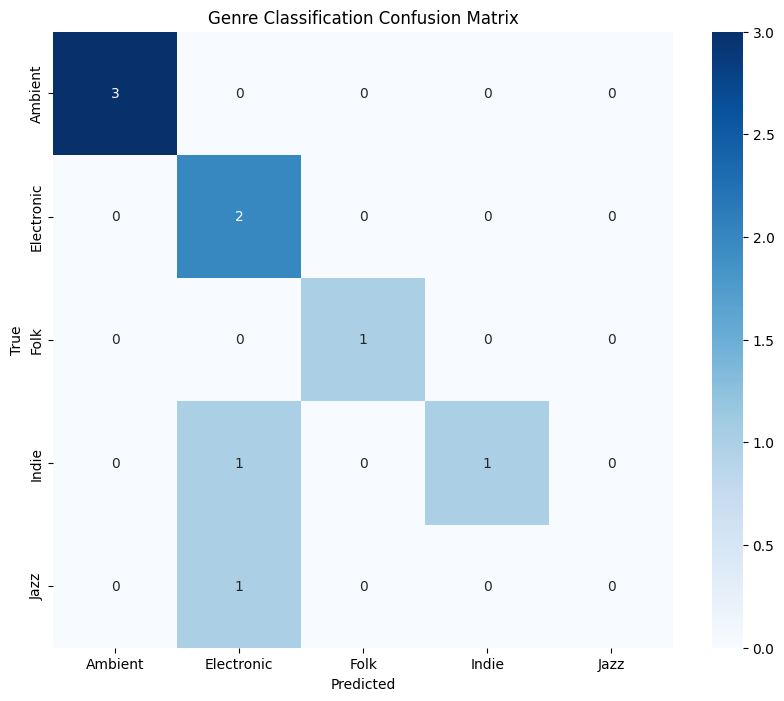

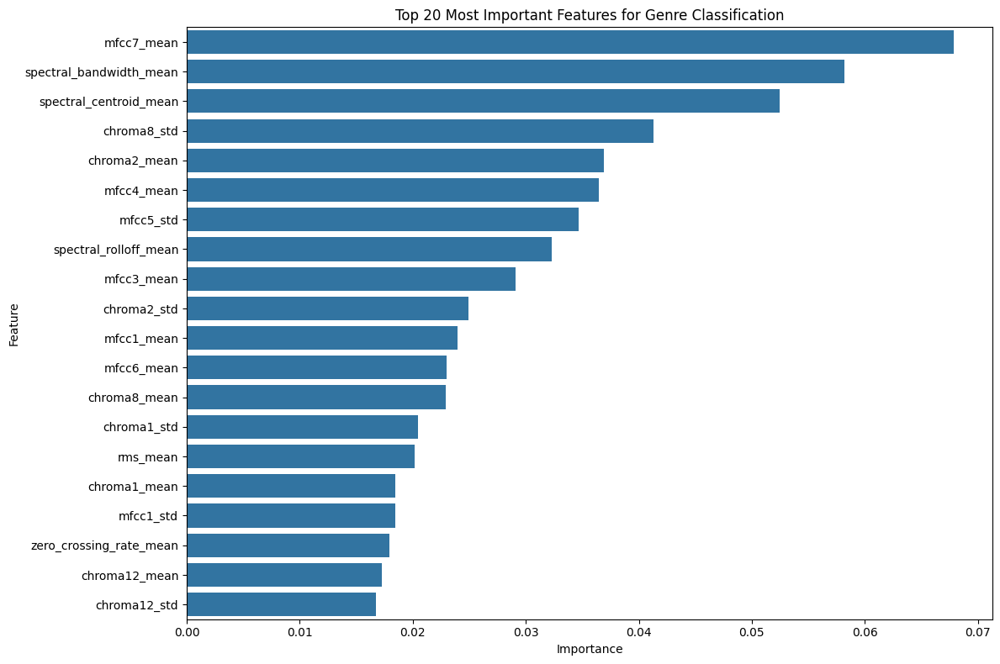

In [1]:
from visualizer_audio import RadioGenreClassifier

# Initialize the classifier with default dataset directory
radio_classifier = RadioGenreClassifier()

# Load pre-existing metadata and features if available
metadata = radio_classifier.load_metadata()
features = radio_classifier.load_features()

# If features aren't available, extract them
if features is None:
    print("Extracting features from audio files...")
    features = radio_classifier.extract_all_features(max_files=100, duration=30)

# Train the classification model
print("Training genre classification model...")
results = radio_classifier.train_model()

# Classify a new audio file
# test_file = "path/to/test_audio.mp3"  # Replace with actual file path
# classification = radio_classifier.classify_new_audio(test_file)

# if classification:
#     print(f"\nFile: {classification['file']}")
#     print(f"Predicted genre: {classification['predicted_genre']}")
#     print("\nGenre probabilities:")
#     for genre, prob in sorted(classification['probabilities'].items(), key=lambda x: x[1], reverse=True):
#         print(f"  {genre}: {prob:.4f}")

# # Generate visualizations for the audio file
# visualizations = radio_classifier.visualize_audio(test_file, save_dir="visualizations")

# if visualizations:
#     print("\nVisualizations saved to:")
#     for viz_type, file_path in visualizations.items():
#         print(f"  {viz_type}: {file_path}")

# # You can also use the classifier in a loop to process multiple files
# import os

# test_directory = "path/to/test_files"  # Replace with actual directory
# for filename in os.listdir(test_directory):
#     if filename.endswith((".mp3", ".wav", ".ogg")):
#         file_path = os.path.join(test_directory, filename)
#         print(f"\nProcessing: {filename}")
        
#         # Classify the file
#         result = radio_classifier.classify_new_audio(file_path)
#         if result:
#             print(f"Predicted genre: {result['predicted_genre']}")

## d) Weather Dataset Collection

Request URL: https://api.openweathermap.org/data/2.5/weather
Request params: q=Mumbai,IN&appid=***&units=metric
Response status: 200
Response text: {"coord":{"lon":72.8479,"lat":19.0144},"weather":[{"id":800,"main":"Clear","description":"clear sky","icon":"01d"}],"base":"stations","main":{"temp":27.75,"feels_like":27.45,"temp_min":27.75,"temp_max...
Request URL: https://api.openweathermap.org/data/2.5/weather
Request params: q=Delhi,IN&appid=***&units=metric
Response status: 200
Response text: {"coord":{"lon":77.2167,"lat":28.6667},"weather":[{"id":800,"main":"Clear","description":"clear sky","icon":"01d"}],"base":"stations","main":{"temp":22.75,"feels_like":21.6,"temp_min":22.75,"temp_max"...
Request URL: https://api.openweathermap.org/data/2.5/weather
Request params: q=Bangalore,IN&appid=***&units=metric
Response status: 200
Response text: {"coord":{"lon":77.6033,"lat":12.9762},"weather":[{"id":803,"main":"Clouds","description":"broken clouds","icon":"04d"}],"base":"stations","main":

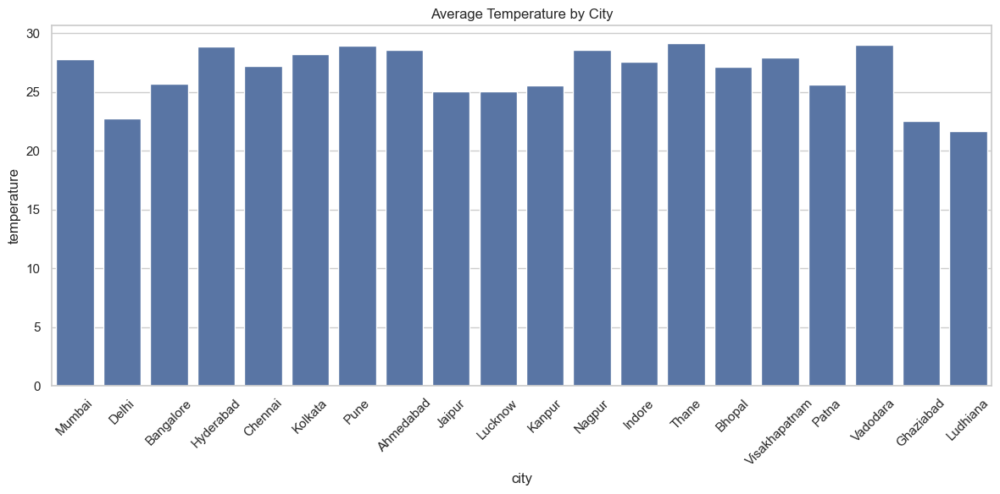

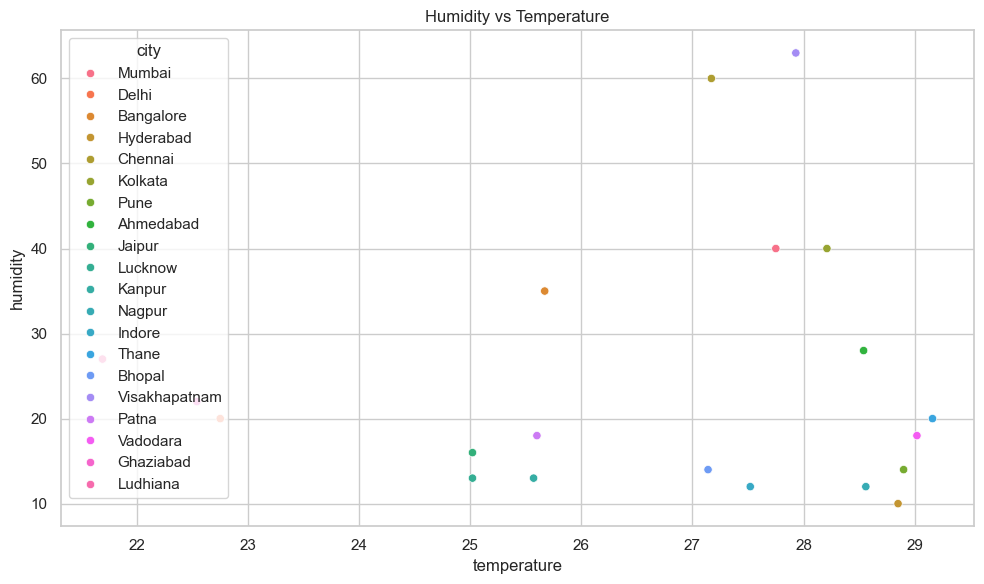

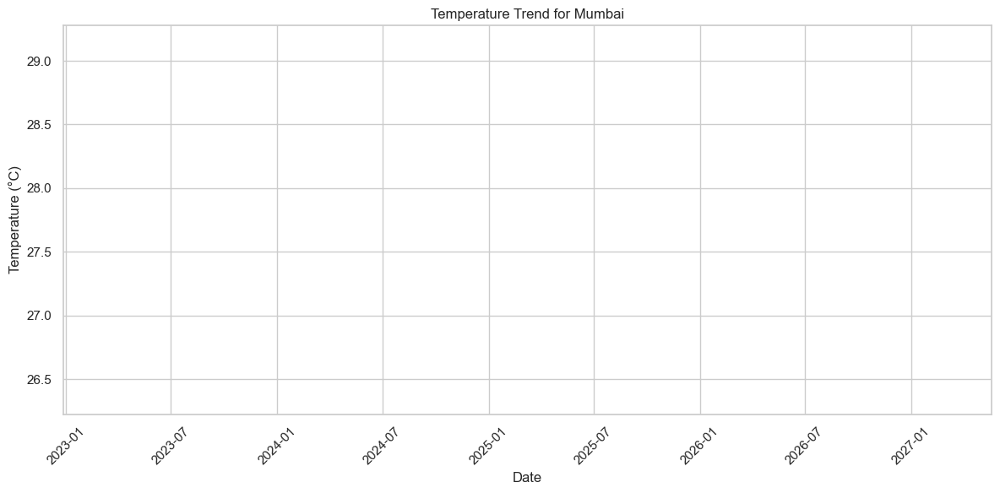

In [27]:
import requests
import pandas as pd
import time
from datetime import datetime, timedelta
import os
import matplotlib.pyplot as plt
import seaborn as sns

class IndiaClimateWatch:
    """
    A class to collect, store, and analyze weather data for Indian cities.
    Dataset Name: IndiaClimateWatch
    """
    
    def __init__(self, api_key):
        """Initialize with OpenWeatherMap API key"""
        self.api_key = api_key
        self.base_url = "https://api.openweathermap.org/data/2.5/weather"
        self.cities = [
            "Mumbai", "Delhi", "Bangalore", "Hyderabad", "Chennai",
            "Kolkata", "Pune", "Ahmedabad", "Jaipur", "Lucknow",
            "Kanpur", "Nagpur", "Indore", "Thane", "Bhopal",
            "Visakhapatnam", "Patna", "Vadodara", "Ghaziabad", "Ludhiana"
        ]
        self.data_dir = "india_climate_data"
        self.ensure_data_directory()
        
    def ensure_data_directory(self):
        """Create data directory if it doesn't exist"""
        if not os.path.exists(self.data_dir):
            os.makedirs(self.data_dir)
            
    def get_weather_data(self, city):
        """Fetch current weather data for a specific city"""
        params = {
            "q": f"{city},IN",
            "appid": self.api_key,
            "units": "metric"  # for Celsius
        }
        
        # Print the URL and params for debugging
        print(f"Request URL: {self.base_url}")
        print(f"Request params: q={city},IN&appid=***&units=metric")
        
        response = requests.get(self.base_url, params=params)
        
        # Print full response for debugging
        print(f"Response status: {response.status_code}")
        print(f"Response text: {response.text[:200]}...")  # Print first 200 chars
        
        if response.status_code == 200:
            data = response.json()
            weather_data = {
                "city": city,
                "timestamp": datetime.now().strftime("%Y-%m-%d %H:%M:%S"),
                "temperature": data["main"]["temp"],
                "feels_like": data["main"]["feels_like"],
                "humidity": data["main"]["humidity"],
                "pressure": data["main"]["pressure"],
                "wind_speed": data["wind"]["speed"],
                "weather_condition": data["weather"][0]["main"],
                "weather_description": data["weather"][0]["description"],
                "clouds": data["clouds"]["all"]
            }
            return weather_data
        else:
            print(f"Error fetching data for {city}: {response.status_code}")
            return None
    
    def collect_all_cities(self):
        """Collect weather data for all cities"""
        all_data = []
        
        for city in self.cities:
            print(f"Collecting data for {city}...")
            city_data = self.get_weather_data(city)
            if city_data:
                all_data.append(city_data)
            # Be nice to the API - avoid rate limiting
            time.sleep(1)
            
        return all_data
    
    def save_to_csv(self, data, filename=None):
        """Save collected data to CSV file"""
        if not data:
            print("No data to save.")
            return
        
        df = pd.DataFrame(data)
        
        if filename is None:
            # Generate filename with current timestamp
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            filename = f"{self.data_dir}/india_weather_{timestamp}.csv"
        else:
            filename = f"{self.data_dir}/{filename}"
            
        df.to_csv(filename, index=False)
        print(f"Data saved to {filename}")
        return filename
    
    def load_csv(self, filename):
        """Load data from a CSV file"""
        full_path = f"{self.data_dir}/{filename}"
        if os.path.exists(full_path):
            return pd.read_csv(full_path)
        else:
            print(f"File not found: {full_path}")
            return None
    
    def collect_periodic_data(self, interval_hours=6, duration_days=30):
        """
        Schedule periodic data collection
        Note: This is a simplified version. In production, you'd use a scheduler like cron.
        """
        total_iterations = (duration_days * 24) // interval_hours
        iteration = 0
        
        print(f"Starting periodic data collection every {interval_hours} hours for {duration_days} days")
        
        while iteration < total_iterations:
            timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
            print(f"\nCollection #{iteration+1} at {timestamp}")
            
            data = self.collect_all_cities()
            self.save_to_csv(data, f"india_weather_{timestamp}.csv")
            
            iteration += 1
            
            if iteration < total_iterations:
                # Calculate next collection time
                next_time = datetime.now() + timedelta(hours=interval_hours)
                print(f"Next collection at {next_time.strftime('%Y-%m-%d %H:%M:%S')}")
                
                # In a real implementation, you'd use a proper scheduler
                # This is just for demonstration
                time.sleep(interval_hours * 3600)  # Convert hours to seconds
    
    def analyze_trends(self, csv_files=None):
        """Analyze weather trends from collected data"""
        if csv_files is None:
            # Use all CSV files in the data directory
            csv_files = [f for f in os.listdir(self.data_dir) if f.endswith('.csv')]
        
        if not csv_files:
            print("No data files found for analysis.")
            return
        
        # Merge all data
        all_data = pd.DataFrame()
        for file in csv_files:
            df = self.load_csv(file)
            if df is not None:
                all_data = pd.concat([all_data, df])
        
        if all_data.empty:
            print("No data loaded for analysis.")
            return
        
        # Convert timestamp to datetime
        all_data['timestamp'] = pd.to_datetime(all_data['timestamp'])
        
        # Sort by timestamp
        all_data = all_data.sort_values('timestamp')
        
        # Basic statistics
        print("\nBasic Statistics:")
        print(all_data[['temperature', 'humidity', 'wind_speed']].describe())
        
        # City comparisons
        city_avg = all_data.groupby('city')[['temperature', 'humidity', 'wind_speed']].mean()
        print("\nCity Averages:")
        print(city_avg)
        
        # Generate visualizations
        self.visualize_data(all_data)
        
        return all_data
    
    def visualize_data(self, df):
        """Create visualizations from the weather data"""
        # Set style
        sns.set(style="whitegrid")
        
        # 1. Temperature comparison across cities
        plt.figure(figsize=(12, 6))
        sns.barplot(x='city', y='temperature', data=df)
        plt.title('Average Temperature by City')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.savefig(f"{self.data_dir}/temperature_comparison.png")
        
        # 2. Humidity vs Temperature
        plt.figure(figsize=(10, 6))
        sns.scatterplot(x='temperature', y='humidity', hue='city', data=df)
        plt.title('Humidity vs Temperature')
        plt.tight_layout()
        plt.savefig(f"{self.data_dir}/humidity_vs_temperature.png")
        
        # 3. Time series for a specific city (e.g., Mumbai)
        if 'Mumbai' in df['city'].values:
            mumbai_data = df[df['city'] == 'Mumbai'].sort_values('timestamp')
            
            plt.figure(figsize=(12, 6))
            plt.plot(mumbai_data['timestamp'], mumbai_data['temperature'])
            plt.title('Temperature Trend for Mumbai')
            plt.xlabel('Date')
            plt.ylabel('Temperature (°C)')
            plt.xticks(rotation=45)
            plt.tight_layout()
            plt.savefig(f"{self.data_dir}/mumbai_temperature_trend.png")
        
        print("Visualizations saved to data directory.")

# Example usage:
if __name__ == "__main__":
    # Replace with your actual OpenWeatherMap API key
    API_KEY = "56a184a8937d739efc17c6a1eb5b1d49"
    
    # Initialize the weather data collector
    india_climate = IndiaClimateWatch(API_KEY)
    
    # For a one-time collection of all cities
    print("Collecting current weather data for all cities...")
    data = india_climate.collect_all_cities()
    csv_file = india_climate.save_to_csv(data)
    
    # Uncomment to run periodic collection (this will run for the specified duration)
    # print("\nStarting periodic collection...")
    # india_climate.collect_periodic_data(interval_hours=6, duration_days=30)
    
    # Analyze the collected data
    print("\nAnalyzing weather data...")
    india_climate.analyze_trends()
    
    print("\nWeather data collection and analysis complete!")

In [22]:
!pip install folium


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: C:\Users\Rishita\AppData\Local\Microsoft\WindowsApps\PythonSoftwareFoundation.Python.3.11_qbz5n2kfra8p0\python.exe -m pip install --upgrade pip


## e) 

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Set style for matplotlib visualizations
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette("viridis")

# --- STEP 1: DATA LOADING ---
def load_data(file_path):
    """
    Load the dataset based on file extension
    Supports CSV, Excel, and JSON formats
    """
    file_extension = file_path.split('.')[-1].lower()
    
    if file_extension == 'csv':
        df = pd.read_csv(file_path, low_memory=False)
    elif file_extension in ['xls', 'xlsx']:
        df = pd.read_excel(file_path)
    elif file_extension == 'json':
        df = pd.read_json(file_path)
    else:
        raise ValueError(f"Unsupported file format: {file_extension}")
    
    print(f"Dataset loaded with shape: {df.shape}")
    return df

# --- STEP 2: DATA CLEANING AND PREPROCESSING ---
def clean_data(df):
    """
    Basic data cleaning operations
    """
    # Make a copy to avoid modifying the original
    df_clean = df.copy()
    
    # Display initial info
    print("\n----- INITIAL DATA INFO -----")
    print(f"Rows: {df_clean.shape[0]}, Columns: {df_clean.shape[1]}")
    print("\nColumn Data Types:")
    print(df_clean.dtypes)
    
    print("\nMissing Values (before cleaning):")
    missing_values = df_clean.isnull().sum()
    print(missing_values[missing_values > 0])
    
    # Fix column names - remove spaces, special chars, make lowercase
    df_clean.columns = [col.lower().replace(' ', '_').replace('-', '_') for col in df_clean.columns]
    
    # Remove duplicate rows
    initial_rows = df_clean.shape[0]
    df_clean = df_clean.drop_duplicates()
    dropped_rows = initial_rows - df_clean.shape[0]
    print(f"\nRemoved {dropped_rows} duplicate rows")
    
    # Handle missing values - this is a basic strategy, you may adjust based on your dataset
    numeric_cols = df_clean.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = df_clean.select_dtypes(include=['object']).columns
    
    # For numeric columns, replace NAs with median
    for col in numeric_cols:
        if df_clean[col].isnull().sum() > 0:
            median_value = df_clean[col].median()
            df_clean[col].fillna(median_value, inplace=True)
            print(f"Filled NAs in '{col}' with median: {median_value}")
    
    # For categorical columns, replace NAs with mode
    for col in categorical_cols:
        if df_clean[col].isnull().sum() > 0:
            mode_value = df_clean[col].mode()[0]
            df_clean[col].fillna(mode_value, inplace=True)
            print(f"Filled NAs in '{col}' with mode: {mode_value}")
    
    # Check for outliers in numeric columns using IQR method
    print("\nChecking for outliers in numeric columns:")
    for col in numeric_cols:
        Q1 = df_clean[col].quantile(0.25)
        Q3 = df_clean[col].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df_clean[(df_clean[col] < lower_bound) | (df_clean[col] > upper_bound)].shape[0]
        if outliers > 0:
            print(f"Column '{col}' has {outliers} outliers")
    
    # Convert date columns to datetime if they exist
    for col in df_clean.columns:
        if any(date_hint in col.lower() for date_hint in ['date', 'year', 'month', 'time']):
            try:
                df_clean[col] = pd.to_datetime(df_clean[col], errors='coerce')
                print(f"Converted '{col}' to datetime")
            except:
                pass
    
    print("\nMissing Values (after cleaning):")
    missing_after = df_clean.isnull().sum()
    print(missing_after[missing_after > 0])
    
    return df_clean

# --- STEP 3: EXPLORATORY DATA ANALYSIS ---
def exploratory_data_analysis(df):
    """
    Perform basic exploratory data analysis
    """
    print("\n----- EXPLORATORY DATA ANALYSIS -----")
    
    # Summary statistics for numeric columns
    print("\nSummary Statistics:")
    print(df.describe().T)
    
    # Frequency counts for categorical columns
    categorical_cols = df.select_dtypes(include=['object']).columns
    if len(categorical_cols) > 0:
        print("\nFrequency Counts for Categorical Variables:")
        for col in categorical_cols[:5]:  # Limit to first 5 to avoid long output
            print(f"\n{col}:")
            value_counts = df[col].value_counts().head(10)
            print(value_counts)
    
    # Check for correlations between numeric variables
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    if len(numeric_cols) > 1:
        print("\nCorrelation Matrix:")
        correlation_matrix = df[numeric_cols].corr()
        print(correlation_matrix.round(2))
        
        # Identify strong correlations
        strong_correlations = []
        for i in range(len(correlation_matrix.columns)):
            for j in range(i):
                if abs(correlation_matrix.iloc[i, j]) > 0.7:
                    strong_correlations.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))
        
        if strong_correlations:
            print("\nStrong Correlations (>0.7 or <-0.7):")
            for var1, var2, corr in strong_correlations:
                print(f"{var1} and {var2}: {corr:.2f}")
    
    return None

# --- STEP 4: DATA VISUALIZATION ---
def create_visualizations(df, output_dir=None):
    """
    Create various visualizations based on data types
    """
    print("\n----- DATA VISUALIZATION -----")
    
    # Identify column types
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = df.select_dtypes(include=['object']).columns
    datetime_cols = df.select_dtypes(include=['datetime64']).columns
    
    # Limit to fewer columns for visualization
    if len(numeric_cols) > 5:
        numeric_cols = numeric_cols[:5]
    if len(categorical_cols) > 5:
        categorical_cols = categorical_cols[:5]
    
    # 1. Distribution of numeric variables
    if len(numeric_cols) > 0:
        print("\nCreating distribution plots for numeric variables...")
        
        # Using matplotlib/seaborn
        plt.figure(figsize=(15, 10))
        for i, col in enumerate(numeric_cols):
            plt.subplot(len(numeric_cols), 2, 2*i+1)
            sns.histplot(df[col], kde=True)
            plt.title(f'Distribution of {col}')
            
            plt.subplot(len(numeric_cols), 2, 2*i+2)
            sns.boxplot(x=df[col])
            plt.title(f'Boxplot of {col}')
        
        plt.tight_layout()
        if output_dir:
            plt.savefig(f"{output_dir}/numeric_distributions.png")
        plt.show()
        
        # Using Plotly for interactive plots
        for col in numeric_cols:
            fig = make_subplots(rows=1, cols=2,
                               subplot_titles=[f'Histogram of {col}', f'Box Plot of {col}'])
            
            fig.add_trace(go.Histogram(x=df[col], name='Histogram', opacity=0.7), row=1, col=1)
            fig.add_trace(go.Box(x=df[col], name='Box Plot'), row=1, col=2)
            
            fig.update_layout(title=f'Distribution Analysis of {col}',
                             height=500, width=900)
            fig.show()
    
    # 2. Bar charts for categorical variables
    if len(categorical_cols) > 0:
        print("\nCreating bar charts for categorical variables...")
        
        for col in categorical_cols:
            # Get top categories (limit to 10)
            value_counts = df[col].value_counts().head(10)
            
            # Using matplotlib/seaborn
            plt.figure(figsize=(12, 6))
            sns.barplot(x=value_counts.index, y=value_counts.values)
            plt.title(f'Top Categories in {col}')
            plt.xticks(rotation=45, ha='right')
            plt.tight_layout()
            if output_dir:
                plt.savefig(f"{output_dir}/categorical_{col}.png")
            plt.show()
            
            # Using Plotly
            fig = px.bar(x=value_counts.index, y=value_counts.values, 
                        title=f'Top Categories in {col}',
                        labels={'x': col, 'y': 'Count'})
            fig.update_layout(xaxis_tickangle=-45)
            fig.show()
    
    # 3. Correlation Heatmap for numeric variables
    if len(numeric_cols) > 1:
        print("\nCreating correlation heatmap...")
        
        correlation_matrix = df[numeric_cols].corr()
        
        # Using matplotlib/seaborn
        plt.figure(figsize=(10, 8))
        sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
        plt.title('Correlation Matrix')
        plt.tight_layout()
        if output_dir:
            plt.savefig(f"{output_dir}/correlation_heatmap.png")
        plt.show()
        
        # Using Plotly
        fig = go.Figure(data=go.Heatmap(
                        z=correlation_matrix.values,
                        x=correlation_matrix.columns,
                        y=correlation_matrix.index,
                        colorscale='RdBu_r',
                        zmin=-1, zmax=1))
        
        fig.update_layout(title='Correlation Matrix',
                         height=600, width=700)
        fig.show()
    
    # 4. Scatter plots for pairs of numeric variables with strong correlation
    if len(numeric_cols) > 1:
        print("\nCreating scatter plots for correlated variables...")
        
        # Find pairs with correlation > 0.5 or < -0.5
        strong_pairs = []
        for i in range(len(numeric_cols)):
            for j in range(i+1, len(numeric_cols)):
                corr = df[numeric_cols[i]].corr(df[numeric_cols[j]])
                if abs(corr) > 0.5:
                    strong_pairs.append((numeric_cols[i], numeric_cols[j], corr))
        
        # Plot up to 3 pairs
        for pair_idx, (var1, var2, corr) in enumerate(strong_pairs[:3]):
            # Using matplotlib/seaborn
            plt.figure(figsize=(10, 6))
            sns.scatterplot(x=df[var1], y=df[var2])
            plt.title(f'Scatter Plot: {var1} vs {var2} (Corr: {corr:.2f})')
            plt.tight_layout()
            if output_dir:
                plt.savefig(f"{output_dir}/scatter_{var1}_{var2}.png")
            plt.show()
            
            # Using Plotly
            fig = px.scatter(df, x=var1, y=var2, 
                           title=f'Scatter Plot: {var1} vs {var2} (Correlation: {corr:.2f})')
            fig.show()
    
    # 5. Time series plots if datetime columns exist
    if len(datetime_cols) > 0:
        print("\nCreating time series plots...")
        
        for date_col in datetime_cols:
            for num_col in numeric_cols[:2]:  # Limit to first 2 numeric columns
                # Make sure dataframe is sorted by date
                df_sorted = df.sort_values(by=date_col)
                
                # Using matplotlib/seaborn
                plt.figure(figsize=(12, 6))
                plt.plot(df_sorted[date_col], df_sorted[num_col])
                plt.title(f'Time Series: {num_col} over {date_col}')
                plt.xticks(rotation=45)
                plt.tight_layout()
                if output_dir:
                    plt.savefig(f"{output_dir}/timeseries_{num_col}.png")
                plt.show()
                
                # Using Plotly
                fig = px.line(df_sorted, x=date_col, y=num_col,
                            title=f'Time Series: {num_col} over {date_col}')
                fig.show()
    
    return None

# --- STEP 5: ADVANCED ANALYSIS AND INSIGHTS ---
def generate_insights(df):
    """
    Generate insights based on the data
    """
    print("\n----- DATA INSIGHTS -----")
    
    # Identify column types
    numeric_cols = df.select_dtypes(include=['int64', 'float64']).columns
    categorical_cols = df.select_dtypes(include=['object']).columns
    datetime_cols = df.select_dtypes(include=['datetime64']).columns
    
    insights = []
    
    # 1. Basic statistics insights
    if len(numeric_cols) > 0:
        # Find columns with high variance
        for col in numeric_cols:
            mean = df[col].mean()
            std = df[col].std()
            cv = std / mean if mean != 0 else 0
            
            if cv > 1:
                insights.append(f"High variability detected in '{col}' (CV = {cv:.2f}), suggesting significant spread in the data.")
        
        # Find outlier-heavy columns
        for col in numeric_cols:
            Q1 = df[col].quantile(0.25)
            Q3 = df[col].quantile(0.75)
            IQR = Q3 - Q1
            lower_bound = Q1 - 1.5 * IQR
            upper_bound = Q3 + 1.5 * IQR
            outlier_pct = df[(df[col] < lower_bound) | (df[col] > upper_bound)].shape[0] / df.shape[0]
            
            if outlier_pct > 0.05:
                insights.append(f"'{col}' has a high proportion of outliers ({outlier_pct:.1%}), which may skew analysis.")
    
    # 2. Correlation insights
    if len(numeric_cols) > 1:
        correlation_matrix = df[numeric_cols].corr()
        
        # Strong positive correlations
        pos_corrs = []
        for i in range(len(correlation_matrix.columns)):
            for j in range(i):
                if correlation_matrix.iloc[i, j] > 0.7:
                    pos_corrs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))
        
        if pos_corrs:
            for var1, var2, corr in pos_corrs[:3]:  # Limit to top 3
                insights.append(f"Strong positive correlation between '{var1}' and '{var2}' (r = {corr:.2f}), suggesting these variables tend to increase together.")
        
        # Strong negative correlations
        neg_corrs = []
        for i in range(len(correlation_matrix.columns)):
            for j in range(i):
                if correlation_matrix.iloc[i, j] < -0.7:
                    neg_corrs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))
        
        if neg_corrs:
            for var1, var2, corr in neg_corrs[:3]:  # Limit to top 3
                insights.append(f"Strong negative correlation between '{var1}' and '{var2}' (r = {corr:.2f}), suggesting as one increases, the other tends to decrease.")
    
    # 3. Categorical data insights
    if len(categorical_cols) > 0:
        for col in categorical_cols:
            value_counts = df[col].value_counts()
            
            # Check for dominance of a single category
            if len(value_counts) > 1 and value_counts.iloc[0] / value_counts.sum() > 0.8:
                insights.append(f"The category '{value_counts.index[0]}' heavily dominates the '{col}' variable, representing {value_counts.iloc[0] / value_counts.sum():.1%} of all values.")
            
            # Check for high cardinality
            if len(value_counts) > 100:
                insights.append(f"High cardinality detected in '{col}' with {len(value_counts)} unique values, which may complicate analysis.")
    
    # 4. Time-based insights
    if len(datetime_cols) > 0:
        for date_col in datetime_cols:
            # Check for temporal patterns
            df['year'] = df[date_col].dt.year
            df['month'] = df[date_col].dt.month
            df['day_of_week'] = df[date_col].dt.dayofweek
            
            for num_col in numeric_cols[:2]:  # Limit to first 2 numeric columns
                # Check for seasonal patterns
                monthly_avg = df.groupby('month')[num_col].mean()
                max_month = monthly_avg.idxmax()
                min_month = monthly_avg.idxmin()
                
                if max_month != min_month and monthly_avg.max() / monthly_avg.min() > 1.5:
                    insights.append(f"'{num_col}' shows seasonal patterns with highest values in month {max_month} and lowest in month {min_month}.")
                
                # Check for day-of-week patterns
                dow_avg = df.groupby('day_of_week')[num_col].mean()
                max_dow = dow_avg.idxmax()
                min_dow = dow_avg.idxmin()
                dow_names = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
                
                if max_dow != min_dow and dow_avg.max() / dow_avg.min() > 1.3:
                    insights.append(f"'{num_col}' shows day-of-week patterns with highest values on {dow_names[max_dow]} and lowest on {dow_names[min_dow]}.")
            
            # Remove temporary columns
            df.drop(['year', 'month', 'day_of_week'], axis=1, inplace=True)
    
    # Print insights
    if insights:
        print("\nKey Insights Generated:")
        for i, insight in enumerate(insights, 1):
            print(f"{i}. {insight}")
    else:
        print("No significant insights were generated from this dataset.")
    
    return insights

# --- MAIN FUNCTION ---
def analyze_india_dataset(file_path, output_dir=None):
    """
    Main function to run the full analysis pipeline
    """
    print("="*50)
    print("INDIA DATA ANALYSIS PIPELINE")
    print("="*50)
    
    # Step 1: Load the data
    print("\nSTEP 1: LOADING DATA")
    df = load_data(file_path)
    
    # Step 2: Clean and preprocess the data
    print("\nSTEP 2: CLEANING AND PREPROCESSING")
    df_clean = clean_data(df)
    
    # Step 3: Perform EDA
    print("\nSTEP 3: EXPLORATORY DATA ANALYSIS")
    exploratory_data_analysis(df_clean)
    
    # Step 4: Create visualizations
    print("\nSTEP 4: DATA VISUALIZATION")
    create_visualizations(df_clean, output_dir)
    
    # Step 5: Generate insights
    print("\nSTEP 5: GENERATING INSIGHTS")
    insights = generate_insights(df_clean)
    
    print("\n" + "="*50)
    print("ANALYSIS COMPLETE")
    print("="*50)
    
    return df_clean, insights


In [ ]:
# Define the path to your dataset
file_path = r"C:\Users\Rishita\Desktop\MMDP-Assignment\Task1_e\apy.csv"  # Replace with your actual file path

# Optional: Set an output directory for saving visualizations
output_dir = r"C:\Users\Rishita\Desktop\MMDP-Assignment\Task1_e\output_india_visuals"  # Replace with your desired output directory

# Run the analysis
cleaned_data, data_insights = analyze_india_dataset(file_path, output_dir)


INDIA DATA ANALYSIS PIPELINE

STEP 1: LOADING DATA
Dataset loaded with shape: (246091, 7)

STEP 2: CLEANING AND PREPROCESSING

----- INITIAL DATA INFO -----
Rows: 246091, Columns: 7

Column Data Types:
State_Name        object
District_Name     object
Crop_Year          int64
Season            object
Crop              object
Area             float64
Production       float64
dtype: object

Missing Values (before cleaning):
Production    3730
dtype: int64

Removed 0 duplicate rows
Filled NAs in 'production' with median: 729.0

Checking for outliers in numeric columns:
Column 'area' has 40705 outliers
Column 'production' has 43062 outliers
Converted 'crop_year' to datetime

Missing Values (after cleaning):
Series([], dtype: int64)

STEP 3: EXPLORATORY DATA ANALYSIS

----- EXPLORATORY DATA ANALYSIS -----

Summary Statistics:
               count                           mean  \
crop_year     246091  1970-01-01 00:00:00.000002005   
area        246091.0                   12002.820864   
pr